In [1]:
import warnings
warnings.filterwarnings("ignore", message="numpy.dtype size changed")
warnings.filterwarnings("ignore", message="numpy.ufunc size changed")
import numpy as np
import sys, os, os.path
import subprocess
import shutil
import time
import signal
import argparse
import random
import torch
import torch.backends.cudnn as cudnn
import model
import data
import tools
import matplotlib.pyplot as plt


In [15]:
parser = argparse.ArgumentParser(description='Main pilot that can train or evaluate online or offline from a dataset.')
  
# ==========================
#   Training Parameters
# ==========================
parser.add_argument("--testing", action='store_true', help="In case we're only testing, the model is tested on the test.txt files and not trained.")
parser.add_argument("--learning_rate", default=0.1, type=float, help="Start learning rate.")
parser.add_argument("--batch_size",default=64,type=int,help="Define the size of minibatches.")
parser.add_argument("--clip",default=1,type=float,help="Clip gradients to avoid 'nan' loss values.")
parser.add_argument("--max_episodes",default=0,type=int,help="The maximum number of episodes (~runs through all the training data.)")
parser.add_argument("--tensorboard", action='store_true', help="Save logging in tensorboard.")
parser.add_argument("--create_scratch_checkpoint", action='store_true', help="Dont train, just save checkpoint before starting and quit.")


# ================================
#   Continual Learning Parameters
# ================================
parser.add_argument("--continual_learning_lambda", default=1, type=float, help="Weight the lifelonglearning regularization term in the overall loss.")
parser.add_argument("--loss_window_length", default=5, type=int, help="Number of loss values kept for detecting a loss plateau in the loss window.")
parser.add_argument("--continual_learning", action='store_true', help="Use MAS regularization term to add knowledge rather than loose knowledge.")
parser.add_argument("--loss_window_mean_threshold", default=0.1,type=float, help="detect plateau of mean and std of loss window is below threshold.")
parser.add_argument("--loss_window_std_threshold", default=0.1,type=float, help="detect plateau of mean and std of loss window is below threshold.")
parser.add_argument("--calculate_importance_weights",action='store_true',help="Calculate the importance weights at the end of training and save them as pickled object.")

# ==========================
#   Offline Parameters
# ==========================
parser.add_argument("--visualize_saliency_of_output",action='store_true',help="Visualize saliency maps of the output.")
parser.add_argument("--visualize_deep_dream_of_output",action='store_true',help="Visualize gradient ascent maps for different extreme controls.")
parser.add_argument("--visualize_activations",action='store_true',help="Visualize activation.")
parser.add_argument("--visualize_control_activation_maps",action='store_true',help="Visualize control activation map.")
parser.add_argument("--histogram_of_activations",action='store_true',help="Summarize all activations in a histogram.")
parser.add_argument("--histogram_of_weights",action='store_true',help="Summarize all weights in a histogram.")

# ===========================
#   Utility Parameters
# ===========================
# Print output of ros verbose or not
parser.add_argument("--load_config", action='store_true',help="Load flags from the configuration file found in the checkpoint path.")
parser.add_argument("--verbose", action='store_false', help="Print output of ros verbose or not.")
parser.add_argument("--summary_dir", default='tensorflow/log/', type=str, help="Choose the directory to which tensorflow should save the summaries.")
parser.add_argument("-t","--log_tag", default='testing', type=str, help="Add log_tag to overcome overwriting of other log files.")
parser.add_argument("--device", default='gpu', type=str, help= "Choose to run on gpu or cpu: /cpu:0 or /gpu:0")
parser.add_argument("--random_seed", default=123, type=int, help="Set the random seed to get similar examples.")
parser.add_argument("--owr", action='store_true', help="Overwrite existing logfolder when it is not testing.")
parser.add_argument("--action_bound", default=0.9, type=float, help= "Define between what bounds the actions can go. Default: [-1:1].")
parser.add_argument("--action_dim", default=1.0, type=float, help= "Define the dimension of the actions: 1dimensional as it only turns in yaw.")
parser.add_argument("--real", action='store_true', help="Define settings in case of interacting with the real (bebop) drone.")
parser.add_argument("--evaluate", action='store_true', help="Just evaluate the network without training.")
parser.add_argument("--random_learning_rate", action='store_true', help="Use sampled learning rate from UL(10**-2, 1)")
parser.add_argument("--plot_depth", action='store_true', help="Specify whether the depth predictions is saved as images.")

# ===========================
#   Data Parameters
# ===========================
# parser.add_argument("--hdf5", action='store_true', help="Define wether dataset is hdf5 type.")
parser.add_argument("--load_data_in_ram", action='store_true', help="Define wether the dataset is preloaded into RAM.")
parser.add_argument("--dataset", default="esatv3_expert_500", type=str, help="pick the dataset in data_root from which your movies can be found.")
parser.add_argument("--data_root", default="pilot_data/",type=str, help="Define the root folder of the different datasets.")
parser.add_argument("--num_threads", default=4, type=int, help="The number of threads for loading one minibatch.")
parser.add_argument("--control_file", default='control_info.txt', type=str, help="Define the name of the file with the action labels.")
parser.add_argument("--depth_directory", default='Depth', type=str, help="Define the name of the directory containing the depth images: Depth or Depth_predicted.")
parser.add_argument("--subsample", default=1, type=int, help="Subsample data over time: e.g. subsample 2 to get from 20fps to 10fps.")
parser.add_argument("--normalized_output", action='store_true', help="Try to fill a batch with different actions [-1, 0, 1].")
parser.add_argument("--shifted_input", action='store_true', help="Shift data from range 0,1 to -0.5,0.5")
parser.add_argument("--skew_input", action='store_true', help="Shift data from range 0:255")
parser.add_argument("--scaled_input", action='store_true', help="Scale the input to 0 mean and 1 std.")
parser.add_argument('--scale_means', default=[0.42, 0.46, 0.5],nargs='+', help="Means used for scaling the input around 0")
parser.add_argument('--scale_stds', default=[0.218, 0.239, 0.2575],nargs='+', help="Stds used for scaling the input around 0")
parser.add_argument("--time_length", default=1, type=int, help="In case of LSTM network, how long in time is network unrolled for training.")
parser.add_argument("--sliding_tbptt", action='store_true', help="In case of LSTM network, slide over batches of data rather than sample randomly.")
parser.add_argument("--accum_grads", action='store_true', help="In case of sliding tbptt, accumulate gradients till a full run is passed to stabilize.")
parser.add_argument("--sliding_step_size", default=1, type=int, help="In case of LSTM network and sliding_tbptt, define the time steps between two consecutive training batches.")
parser.add_argument("--init_state_subsample", default=1, type=int, help="Calculate init state on subsampled data sequence.")
parser.add_argument("--only_init_state", action='store_true', help="Don't calculate the cell state by each time window applying the init state.")


# ===========================
#   Model Parameters
# ===========================
parser.add_argument("--depth_multiplier",default=0.25,type=float, help= "Define the depth of the network in case of mobilenet.")
parser.add_argument("--network",default='tiny_net',type=str, help="Define the type of network: mobile, mobile_nfc, alex, squeeze, ...")
# parser.add_argument("--output_size",default=[55,74],type=int, nargs=2, help="Define the output size of the depth frame: 55x74 [drone], 1x26 [turtle], only used in case of depth_q_net.")
parser.add_argument("--pretrained", action='store_true',help="Specify whether the network should be loaded with imagenet pretrained features.")
parser.add_argument("--feature_extract", action='store_true',help="In case of feature extract, the model feature extraction part of the network won't be trained.")
# parser.add_argument("--n_fc", action='store_true',help="In case of True, prelogit features are concatenated before feeding to the fully connected layers.")
parser.add_argument("--n_frames",default=2,type=int,help="Specify the amount of frames concatenated in case of n_fc  or 3D-CNN.")
parser.add_argument("--auxiliary_depth", action='store_true',help="Specify whether a depth map is predicted.")
parser.add_argument("--discrete", action='store_true',help="Specify whether the output action space is discrete.")
parser.add_argument("--stochastic", action='store_true', help="Sample action from predictions from a binomial distribution over classes rather than taking the argmax.")
parser.add_argument("--action_quantity",default=3, type=int, help="Define the number of actions in the output layer.")

# INITIALIZATION
parser.add_argument("--checkpoint_path",default='', type=str, help="Specify the directory of the checkpoint of the earlier trained model.")
parser.add_argument("--continue_training",action='store_true', help="Continue training of the prediction layers. If false, initialize the prediction layers randomly.")
# parser.add_argument("--scratch", action='store_true', help="Initialize full network randomly.")

# TRAINING

parser.add_argument("--il_weight", default=1.0, type=float, help="Define the weight of the Imitation Learning Loss in comparison to the Reinforcement Learning Loss.")
parser.add_argument("--depth_weight", default=1.0, type=float, help="Define the weight applied to the depth values in the loss relative to the control loss.")
parser.add_argument("--control_weight", default=1.0, type=float, help="Define the weight applied to the control loss.")
parser.add_argument("--weight_decay",default=0.0,type=float, help= "Weight decay of inception network")
parser.add_argument("--init_scale", default=0.0005, type=float, help= "Std of uniform initialization")
parser.add_argument("--grad_mul_weight", default=0.001, type=float, help="Specify the amount the gradients of prediction layers.")
parser.add_argument("--dropout", default=0.5, type=float, help="Specify the probability of dropout to keep the activation.")
# parser.add_argument("--hidden_size", default=100, type=float, help="Specify the probability of dropout to keep the activation.")

parser.add_argument("--min_depth", default=0.0, type=float, help="clip depth loss with weigths to focus on correct depth range.")
parser.add_argument("--max_depth", default=5.0, type=float, help="clip depth loss with weigths to focus on correct depth range.")
parser.add_argument("--optimizer", default='SGD', type=str, help="Specify optimizer, options: Adadelta, SGD")
parser.add_argument("--no_batchnorm_learning",action='store_false', help="In case of no batchnorm learning, are the batch normalization params (alphas and betas) not further adjusted.")
parser.add_argument("--initializer",default='xavier',type=str, help="Define the initializer: xavier or uniform [-init_scale, init_scale]")

parser.add_argument("--loss",default='MSE',type=str, help="Define the loss: MSE, CrossEntropy")

# parser.add_argument("--max_loss", default=100, type=float, help= "Define the maximum loss before it is clipped.")
# parser.add_argument("--clip_loss_to_max",action='store_true', help="Over time, allow only smaller losses by clipping the maximum allowed loss to the lowest maximum loss.")

# ===========================
#   Replay Parameters
# ===========================

parser.add_argument("--replay_priority", default='no', type=str, help="Define which type of weights should be used when sampling from replay buffer: no, uniform_action, uniform_collision, td_error, state/action/target_variance, random_action")
parser.add_argument("--prioritized_keeping", action='store_true', help="In case of True, the replay buffer only keeps replay data that is most likely to be sampled.")
parser.add_argument("--hard_replay_buffer", action='store_true', help="Add a replaybuffer with the hardest examples (according to the loss).")
parser.add_argument("--hard_batch_size", default=100, type=int, help="Define the amount of data in one batch coming from a hard replay buffer.")

# ===========================
#   Rosinterface Parameters
# ===========================
parser.add_argument("--online", action='store_true', help="Training/evaluating online in simulation.")
parser.add_argument("--buffer_size", default=1000, type=int, help="Define the number of experiences saved in the buffer.")
parser.add_argument("--ou_theta", default=0.05, type=float, help= "Theta is the pull back force of the OU Noise.")
parser.add_argument("--noise", default='ou', type=str, help="Define whether the noise is temporally correlated (ou) or uniformly distributed (uni).")
parser.add_argument("--sigma_z", default=0.0, type=float, help= "sigma_z is the amount of noise in the z direction.")
parser.add_argument("--sigma_x", default=0.0, type=float, help= "sigma_x is the amount of noise in the forward speed.")
parser.add_argument("--sigma_y", default=0.0, type=float, help= "sigma_y is the amount of noise in the y direction.")
parser.add_argument("--sigma_yaw", default=0.0, type=float, help= "sigma_yaw is the amount of noise added to the steering angle.")
parser.add_argument("--speed", default=1.3, type=float, help= "Define the forward speed of the quadrotor.")
parser.add_argument("--turn_speed", default=0.5, type=float, help= "Define the forward speed while turning.")
parser.add_argument("--alpha",default=0., type=float, help="Policy mixing: choose with a binomial probability of alpha for the experts policy instead of the DNN policy..")
parser.add_argument("--epsilon",default=0, type=float, help="Apply epsilon-greedy policy for exploration.")
parser.add_argument("--epsilon_decay", default=0.0, type=float, help="Decay the epsilon exploration over time with a slow decay rate of 1/10.")

parser.add_argument("--prefill", action='store_true', help="Fill the replay buffer first with random (epsilon 1) flying behavior before training.")
parser.add_argument("--gradient_steps", default=1, type=int, help="Define the number of batches or gradient steps are taken between 2 runs.")
# parser.add_argument("--empty_buffer", action='store_true', help="Empty buffer after each rollout.")
parser.add_argument("--buffer_update_rule", default='nothing',type=str, help="nothing: FIFO buffer. empty: empty buffer after each training step. TODO: hard: drop certain partition of recent frames and keep only hardest.")
parser.add_argument("--buffer_hard_ratio", default=1,type=float, help="if buffer_update_rule == hard, arange this ratio of the buffer's samples according to how hard they are and drop the rest, to be filled with recent frames.")

parser.add_argument("--max_batch_size", default=-1, type=int, help="Define the max size of the batch (only if batch_size is -1).")
parser.add_argument("--recovery_compensation", default=1, type=float, help="Define amount the neural network should compensate for the to-be-recovered movement.")

# parser.add_argument("--dont_show_depth",action='store_true', help="Publish the predicted horizontal depth array to topic ./depth_prection so show_depth can visualize this in another node.")

parser.add_argument("--field_of_view", default=104, type=int, help="The field of view of the camera cuts the depth scan in the range visible for the camera. Value should be even. Normal: 72 (-36:36), Wide-Angle: 120 (-60:60)")
parser.add_argument("--smooth_scan", default=4, type=int, help="The 360degrees scan has a lot of noise and is therefore smoothed out over 4 neighboring scan readings")

parser.add_argument("--pause_simulator", action='store_true', help="Pause simulator during frame processing, making discrete steps.")
parser.add_argument("--export_buffer", action='store_true', help="Save the replaybuffer as dataset after each run.")
parser.add_argument("--no_training", action='store_true', help="avoid saving to the replay buffer and taking gradient steps.")

parser.add_argument("--horizon", default=0, type=int, help="Define the number steps back before collision, the collision label is applied to. ")
parser.add_argument("--save_every_num_epochs", default=0, type=int, help="Define after how many epochs a model should be saved while training online.")


print("[main.py] Found {0} cuda devices available.".format(torch.cuda.device_count()))

# FLAGS=parser.parse_args()
try:
    FLAGS, others = parser.parse_known_args()
except:
    sys.exit(2)
np.random.seed(FLAGS.random_seed)
random.seed(FLAGS.random_seed)
torch.manual_seed(FLAGS.random_seed)
torch.cuda.manual_seed(FLAGS.random_seed)
cudnn.benchmark = False
cudnn.deterministic = True
if FLAGS.summary_dir[0] != '/': FLAGS.summary_dir = os.path.join(os.getenv('HOME'),FLAGS.summary_dir)

[main.py] Found 1 cuda devices available.


In [16]:
# Settings reference on Esatv3 5K
# FLAGS.network='tinyv3_3d_net'
# FLAGS.n_frames=2
# FLAGS.checkpoint_path='tinyv3_3d_net_2_continuous_scratch'

FLAGS.discrete=True
FLAGS.network='tinyv3_net'
FLAGS.checkpoint_path='tinyv3_net_scratch'

FLAGS.loss_window_mean_threshold=0.3
FLAGS.loss_window_std_threshold=0.25
FLAGS.continual_learning=True

FLAGS.dataset='esatv3_expert_5K'
FLAGS.tensorboard=True 
FLAGS.batch_size=32 
FLAGS.learning_rate=0.02
FLAGS.loss='CrossEntropy'
FLAGS.shifted_input=True
FLAGS.optimizer='SGD'
FLAGS.continue_training=True
FLAGS.clip=1.0 
FLAGS.log_tag='test_online_offpolicy'
FLAGS.subsample=10
FLAGS.gradient_steps=3
FLAGS.load_data_in_ram=True

In [3]:
FLAGS.checkpoint_path='test_online_offpolicy'
FLAGS.load_config=True

FLAGS.loss_window_mean_threshold=0.3
FLAGS.loss_window_std_threshold=0.25
FLAGS.continual_learning=True

FLAGS.dataset='esatv3_expert_5K'
FLAGS.tensorboard=True 
FLAGS.batch_size=32 
FLAGS.learning_rate=0.02
FLAGS.loss='CrossEntropy'
FLAGS.shifted_input=True
FLAGS.optimizer='SGD'
FLAGS.continue_training=True
FLAGS.clip=1.0 
FLAGS.log_tag='test_online_offpolicy'
FLAGS.subsample=10
FLAGS.gradient_steps=3
FLAGS.load_data_in_ram=True

In [17]:
# Adjust some final settings and save config
if len(FLAGS.checkpoint_path) != 0 and FLAGS.checkpoint_path[0] != '/': 
    FLAGS.checkpoint_path = os.path.join(FLAGS.summary_dir, FLAGS.checkpoint_path) 
if not os.path.isdir(FLAGS.summary_dir+FLAGS.log_tag): 
    os.makedirs(FLAGS.summary_dir+FLAGS.log_tag)
if FLAGS.load_config:
    FLAGS=tools.load_config(FLAGS, FLAGS.checkpoint_path)

tools.save_config(FLAGS, FLAGS.summary_dir+FLAGS.log_tag)


[tools] Save configuration to: /esat/opal/kkelchte/docker_home/tensorflow/log/test_online_offpolicy


In [18]:
# reload(model)
# Load model
mymodel = model.Model(FLAGS)

[model.py]: Divided 3 discrete actions over [-0.9, 0.0, 0.9] with boundaries [-0.45, 0.45].
[model] Total number of trainable parameters: 511838
[model]: loaded model from /esat/opal/kkelchte/docker_home/tensorflow/log/tinyv3_net_scratch at epoch: 0


In [15]:
# Prepare data
data.prepare_data(FLAGS, mymodel.input_size)

[data] 00002_esatv3
[data] 00000_esatv3


/users/visics/kkelchte/tensorflow_1.8/lib/python2.7/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


[data] 00003_esatv3
[data] 00001_esatv3


[model]: loaded model from /esat/opal/kkelchte/docker_home/tensorflow/log/tinyv3_net_scratch at epoch: 0


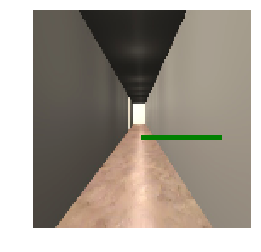

time: 19.38.34, run: 00000_esatv3, frame: 31, loss: 1.0384824276


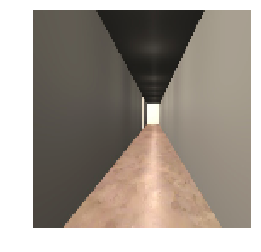

time: 19.38.34, run: 00000_esatv3, frame: 32, loss: 0.845874190331


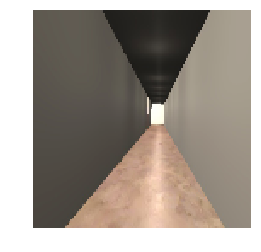

time: 19.38.34, run: 00000_esatv3, frame: 33, loss: 0.650216758251


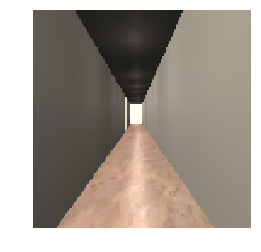

time: 19.38.35, run: 00000_esatv3, frame: 34, loss: 0.479139924049


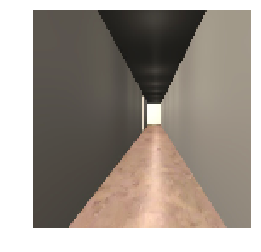

time: 19.38.35, run: 00000_esatv3, frame: 35, loss: 0.368316292763


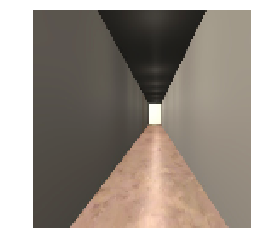

time: 19.38.35, run: 00000_esatv3, frame: 36, loss: 0.325941085815


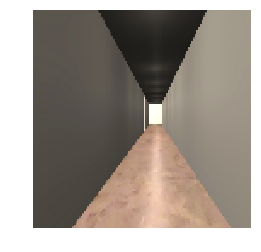

time: 19.38.35, run: 00000_esatv3, frame: 37, loss: 0.305796086788


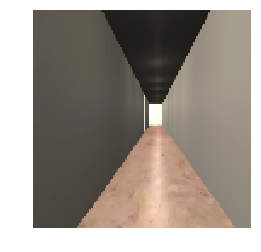

time: 19.38.35, run: 00000_esatv3, frame: 38, loss: 0.290310025215


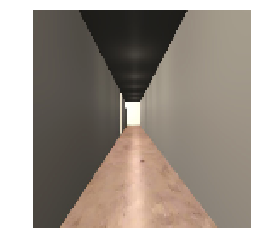

time: 19.38.35, run: 00000_esatv3, frame: 39, loss: 0.277765899897


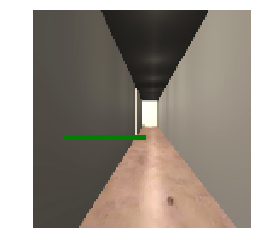

time: 19.38.35, run: 00000_esatv3, frame: 40, loss: 0.326396942139


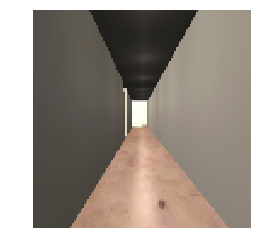

time: 19.38.35, run: 00000_esatv3, frame: 41, loss: 0.310014039278


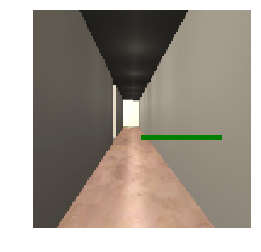

time: 19.38.36, run: 00000_esatv3, frame: 42, loss: 0.34581130743


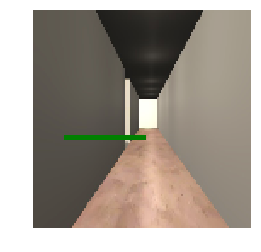

time: 19.38.36, run: 00000_esatv3, frame: 43, loss: 0.371065974236


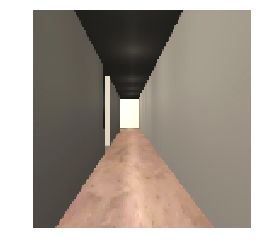

time: 19.38.36, run: 00000_esatv3, frame: 44, loss: 0.357215672731


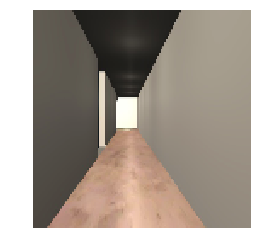

time: 19.38.36, run: 00000_esatv3, frame: 45, loss: 0.345409691334


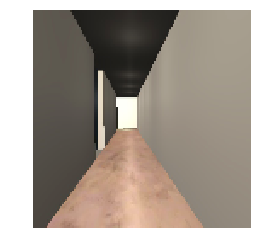

time: 19.38.36, run: 00000_esatv3, frame: 46, loss: 0.335695564747


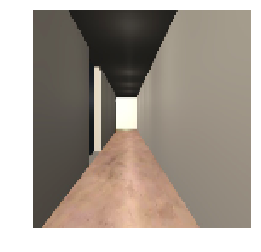

time: 19.38.36, run: 00000_esatv3, frame: 47, loss: 0.326619893312


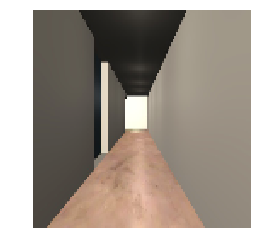

time: 19.38.36, run: 00000_esatv3, frame: 48, loss: 0.318594962358


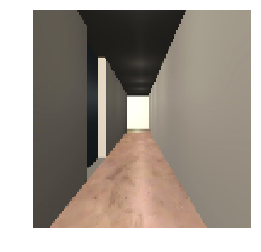

time: 19.38.36, run: 00000_esatv3, frame: 49, loss: 0.310494035482


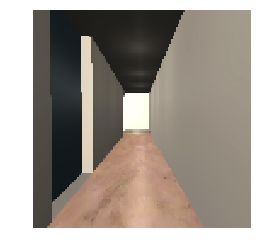

time: 19.38.37, run: 00000_esatv3, frame: 50, loss: 0.302551597357


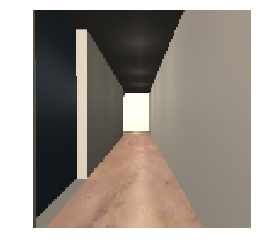

time: 19.38.37, run: 00000_esatv3, frame: 51, loss: 0.294591248035


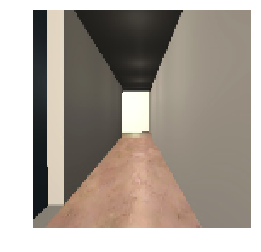

time: 19.38.37, run: 00000_esatv3, frame: 52, loss: 0.288279652596
calculate importance weights
[tools] calculate_importance_weights
0
[tools] duration 0.157298088074


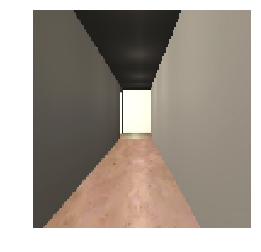

time: 19.38.37, run: 00000_esatv3, frame: 53, loss: 0.281991928816


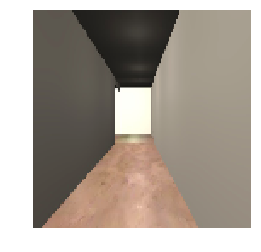

time: 19.38.37, run: 00000_esatv3, frame: 54, loss: 0.276103585958


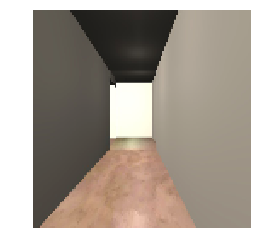

time: 19.38.37, run: 00000_esatv3, frame: 55, loss: 0.269927442074


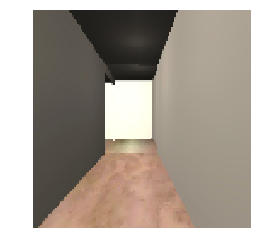

time: 19.38.38, run: 00000_esatv3, frame: 56, loss: 0.264018386602


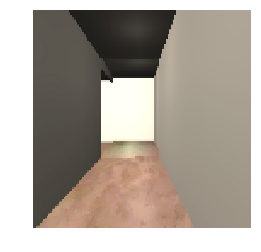

time: 19.38.38, run: 00000_esatv3, frame: 57, loss: 0.257856547832


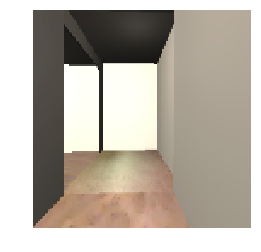

time: 19.38.38, run: 00000_esatv3, frame: 58, loss: 0.251021146774


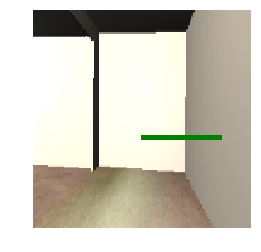

time: 19.38.38, run: 00000_esatv3, frame: 59, loss: 0.268113106489


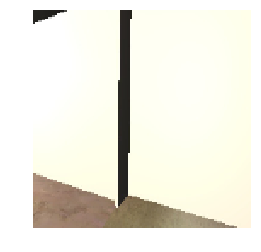

time: 19.38.38, run: 00000_esatv3, frame: 60, loss: 0.268578201532


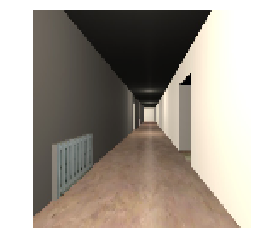

time: 19.38.38, run: 00000_esatv3, frame: 61, loss: 0.261559486389


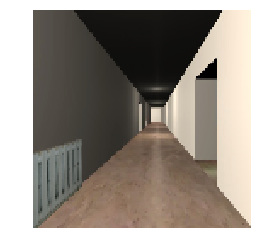

time: 19.38.38, run: 00000_esatv3, frame: 62, loss: 0.252695083618


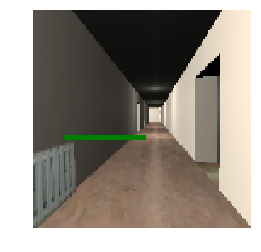

time: 19.38.39, run: 00000_esatv3, frame: 63, loss: 0.319607615471


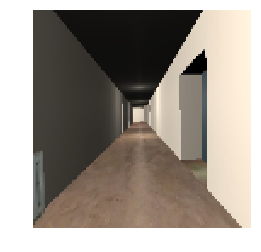

time: 19.38.39, run: 00000_esatv3, frame: 64, loss: 0.312602519989


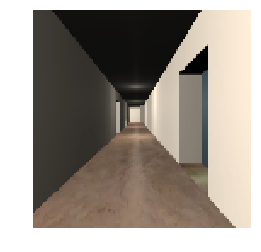

time: 19.38.39, run: 00000_esatv3, frame: 65, loss: 0.301802098751


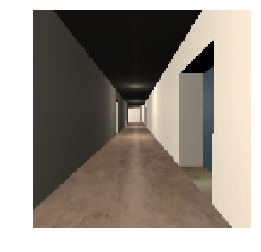

time: 19.38.39, run: 00000_esatv3, frame: 66, loss: 0.293544411659
peak detected


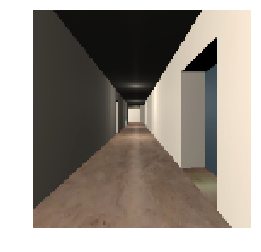

time: 19.38.39, run: 00000_esatv3, frame: 67, loss: 0.285652399063
calculate importance weights
[tools] calculate_importance_weights
0
[tools] duration 0.226555109024


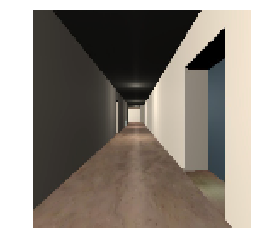

time: 19.38.40, run: 00000_esatv3, frame: 68, loss: 0.277927458286


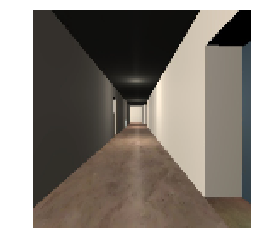

time: 19.38.40, run: 00000_esatv3, frame: 69, loss: 0.271189600229


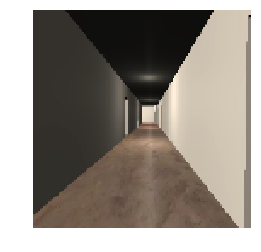

time: 19.38.40, run: 00000_esatv3, frame: 70, loss: 0.264290481806


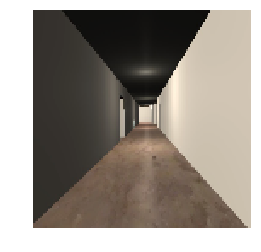

time: 19.38.40, run: 00000_esatv3, frame: 71, loss: 0.258617460728


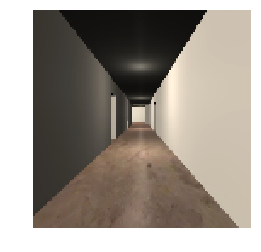

time: 19.38.40, run: 00000_esatv3, frame: 72, loss: 0.252501904964


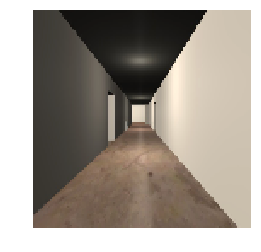

time: 19.38.40, run: 00000_esatv3, frame: 73, loss: 0.247243672609


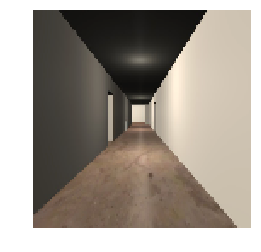

time: 19.38.40, run: 00000_esatv3, frame: 74, loss: 0.241481214762


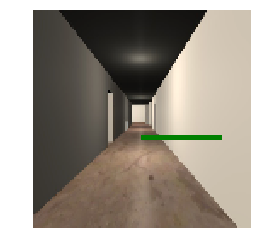

time: 19.38.41, run: 00000_esatv3, frame: 75, loss: 0.282822996378


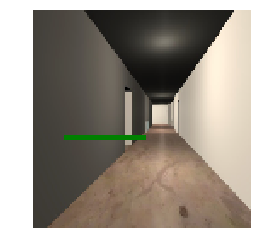

time: 19.38.41, run: 00000_esatv3, frame: 76, loss: 0.307346582413


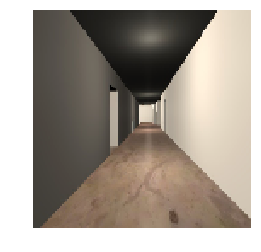

time: 19.38.41, run: 00000_esatv3, frame: 77, loss: 0.30487370491


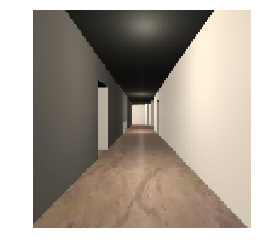

time: 19.38.41, run: 00000_esatv3, frame: 78, loss: 0.294356077909


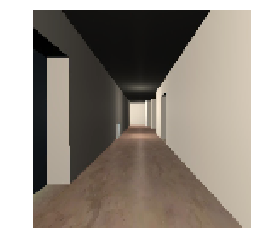

time: 19.38.41, run: 00000_esatv3, frame: 79, loss: 0.291534513235


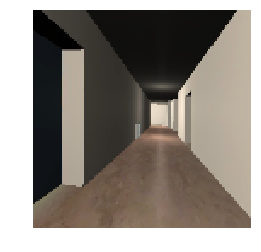

time: 19.38.41, run: 00000_esatv3, frame: 80, loss: 0.28295108676


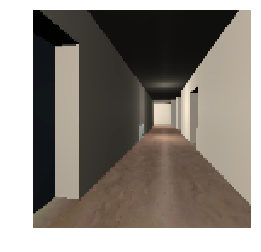

time: 19.38.41, run: 00000_esatv3, frame: 81, loss: 0.279039859772


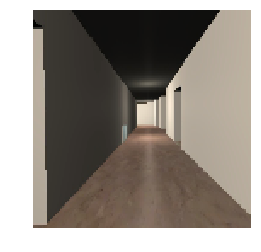

time: 19.38.42, run: 00000_esatv3, frame: 82, loss: 0.27518042922


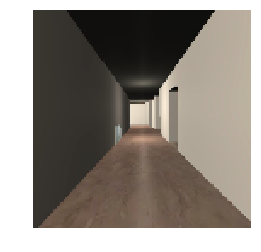

time: 19.38.42, run: 00000_esatv3, frame: 83, loss: 0.270001500845


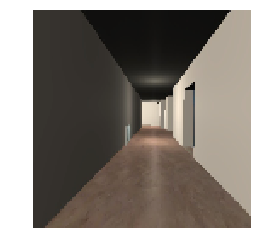

time: 19.38.42, run: 00000_esatv3, frame: 84, loss: 0.267141222954


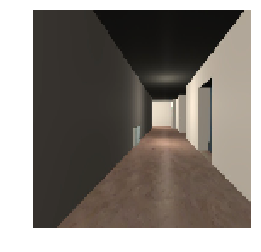

time: 19.38.42, run: 00000_esatv3, frame: 85, loss: 0.260905623436


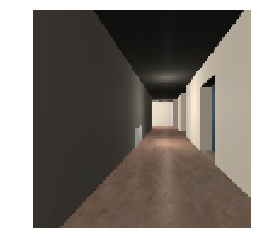

time: 19.38.42, run: 00000_esatv3, frame: 86, loss: 0.258245199919


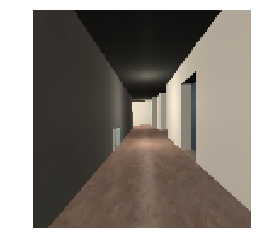

time: 19.38.42, run: 00000_esatv3, frame: 87, loss: 0.252659887075


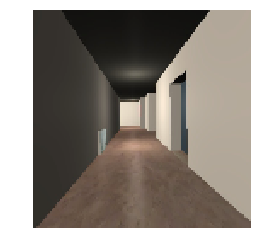

time: 19.38.43, run: 00000_esatv3, frame: 88, loss: 0.251053452492


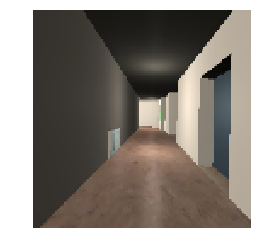

time: 19.38.43, run: 00000_esatv3, frame: 89, loss: 0.245170578361


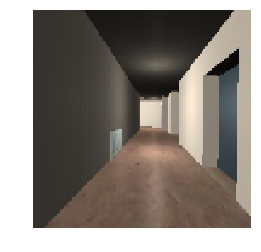

time: 19.38.43, run: 00000_esatv3, frame: 90, loss: 0.245457455516


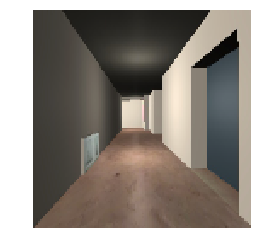

time: 19.38.43, run: 00000_esatv3, frame: 91, loss: 0.238591551781


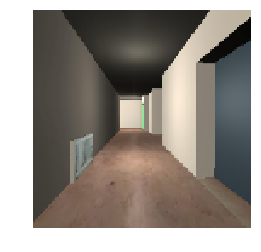

time: 19.38.43, run: 00000_esatv3, frame: 92, loss: 0.238828986883


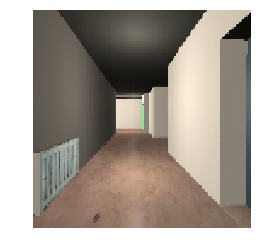

time: 19.38.43, run: 00000_esatv3, frame: 93, loss: 0.233548343182


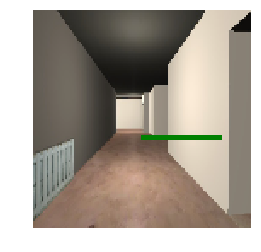

time: 19.38.44, run: 00000_esatv3, frame: 94, loss: 0.249849095941


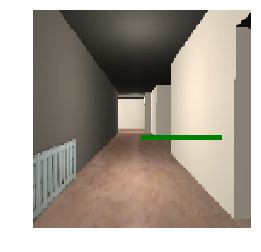

time: 19.38.44, run: 00000_esatv3, frame: 95, loss: 0.26551041007


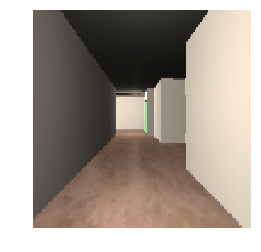

time: 19.38.44, run: 00000_esatv3, frame: 96, loss: 0.253628015518


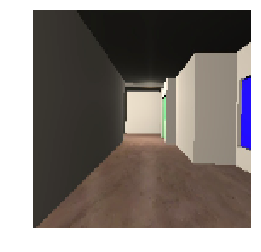

time: 19.38.44, run: 00000_esatv3, frame: 97, loss: 0.251803725958


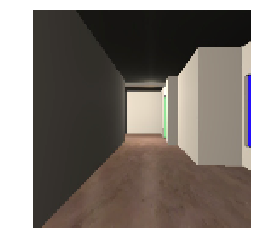

time: 19.38.44, run: 00000_esatv3, frame: 98, loss: 0.242040485144


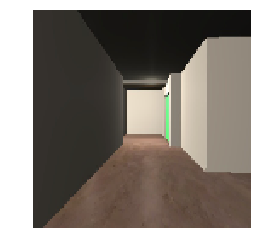

time: 19.38.44, run: 00000_esatv3, frame: 99, loss: 0.240672633052


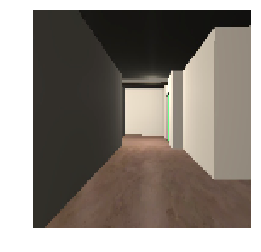

time: 19.38.45, run: 00000_esatv3, frame: 100, loss: 0.232401669025


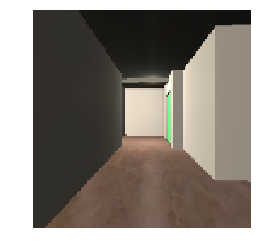

time: 19.38.45, run: 00000_esatv3, frame: 101, loss: 0.231479912996


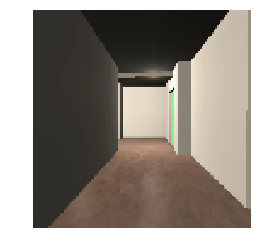

time: 19.38.45, run: 00000_esatv3, frame: 102, loss: 0.224296018481


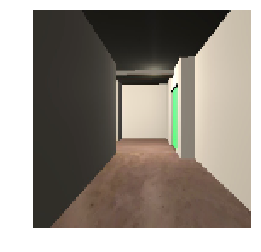

time: 19.38.45, run: 00000_esatv3, frame: 103, loss: 0.223511070013


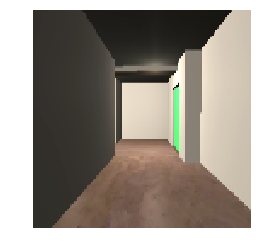

time: 19.38.45, run: 00000_esatv3, frame: 104, loss: 0.217238724232


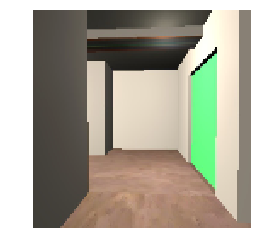

time: 19.38.45, run: 00000_esatv3, frame: 105, loss: 0.216339752078


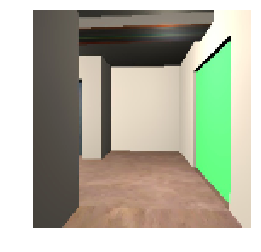

time: 19.38.46, run: 00000_esatv3, frame: 106, loss: 0.210275009274


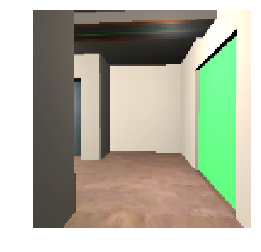

time: 19.38.46, run: 00000_esatv3, frame: 107, loss: 0.209743976593


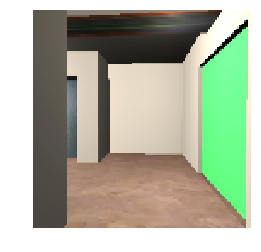

time: 19.38.46, run: 00000_esatv3, frame: 108, loss: 0.203927353024


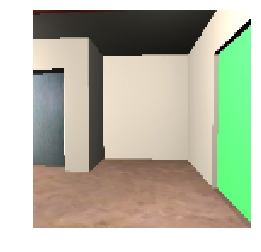

time: 19.38.46, run: 00000_esatv3, frame: 109, loss: 0.205639749765


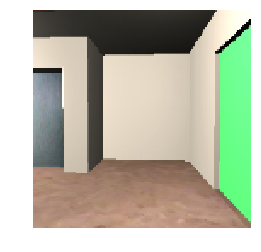

time: 19.38.46, run: 00000_esatv3, frame: 110, loss: 0.202682614326


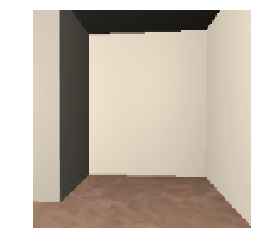

time: 19.38.46, run: 00000_esatv3, frame: 111, loss: 0.204082891345


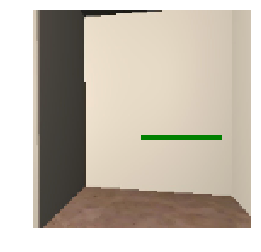

time: 19.38.47, run: 00000_esatv3, frame: 112, loss: 0.227933272719


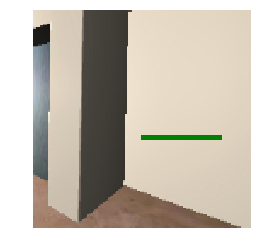

time: 19.38.47, run: 00000_esatv3, frame: 113, loss: 0.235251411796


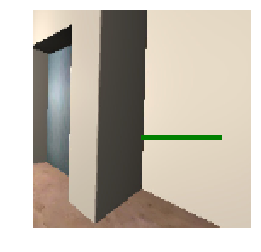

time: 19.38.47, run: 00000_esatv3, frame: 114, loss: 0.238003969193


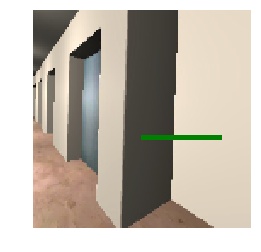

time: 19.38.47, run: 00000_esatv3, frame: 115, loss: 0.24987359345


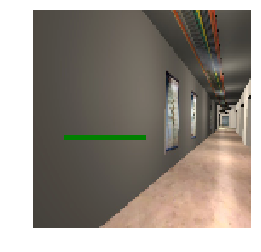

time: 19.38.47, run: 00000_esatv3, frame: 116, loss: 0.249223396182


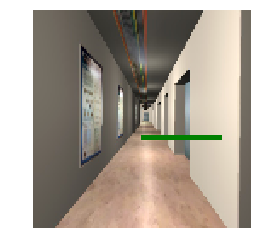

time: 19.38.47, run: 00000_esatv3, frame: 117, loss: 0.260349363089


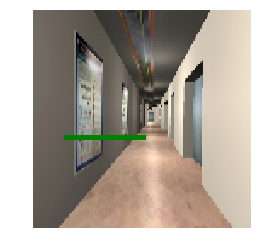

time: 19.38.48, run: 00000_esatv3, frame: 118, loss: 0.256787925959


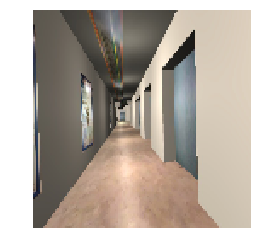

time: 19.38.48, run: 00000_esatv3, frame: 119, loss: 0.258867323399


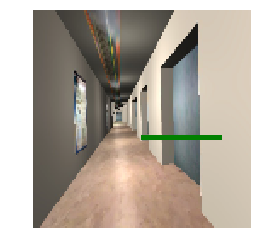

time: 19.38.48, run: 00000_esatv3, frame: 120, loss: 0.26789316535


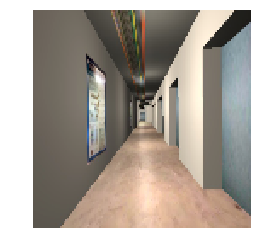

time: 19.38.48, run: 00000_esatv3, frame: 121, loss: 0.270138770342


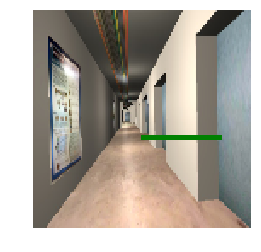

time: 19.38.48, run: 00000_esatv3, frame: 122, loss: 0.282195419073


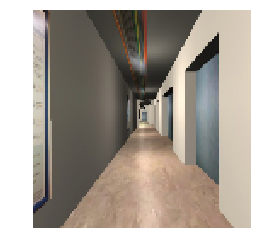

time: 19.38.49, run: 00000_esatv3, frame: 123, loss: 0.286909371614


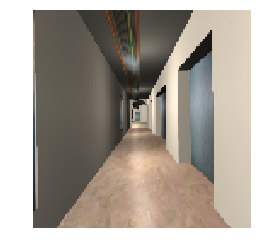

time: 19.38.49, run: 00000_esatv3, frame: 124, loss: 0.279973715544


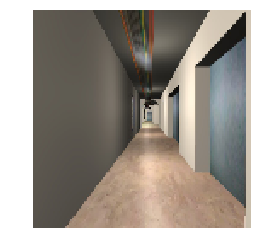

time: 19.38.49, run: 00000_esatv3, frame: 125, loss: 0.280215322971


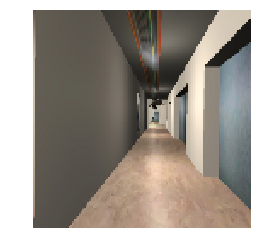

time: 19.38.49, run: 00000_esatv3, frame: 126, loss: 0.279746383429


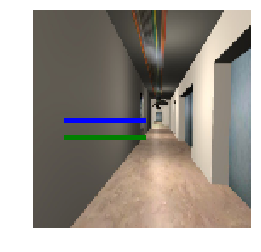

time: 19.38.49, run: 00000_esatv3, frame: 127, loss: 0.281034171581


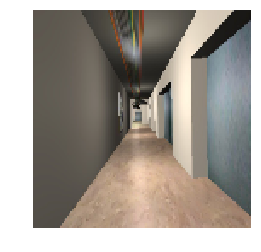

time: 19.38.49, run: 00000_esatv3, frame: 128, loss: 0.275268614292


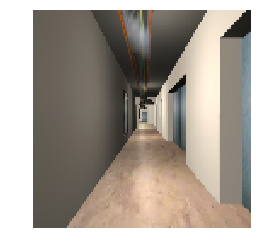

time: 19.38.50, run: 00000_esatv3, frame: 129, loss: 0.274611145258


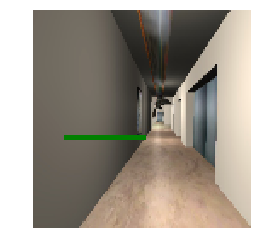

time: 19.38.50, run: 00000_esatv3, frame: 130, loss: 0.278331756592


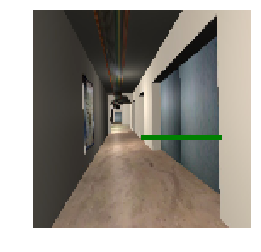

time: 19.38.50, run: 00000_esatv3, frame: 131, loss: 0.329838037491


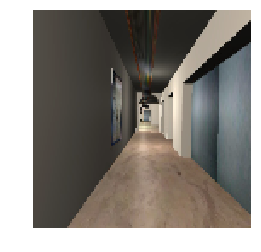

time: 19.38.50, run: 00000_esatv3, frame: 132, loss: 0.313640803099


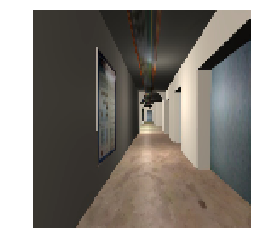

time: 19.38.50, run: 00000_esatv3, frame: 133, loss: 0.315826237202
peak detected


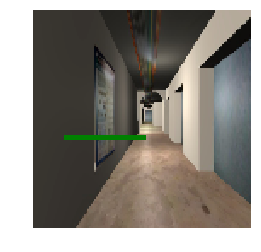

time: 19.38.50, run: 00000_esatv3, frame: 134, loss: 0.311635792255


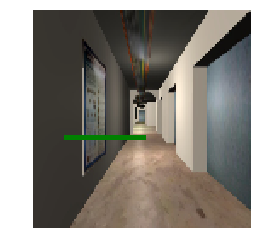

time: 19.38.51, run: 00000_esatv3, frame: 135, loss: 0.34120631218


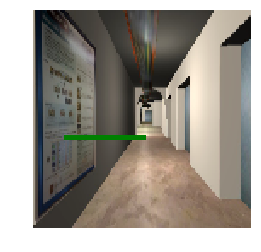

time: 19.38.51, run: 00000_esatv3, frame: 136, loss: 0.325639367104


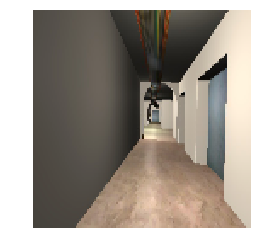

time: 19.38.51, run: 00000_esatv3, frame: 137, loss: 0.336019486189


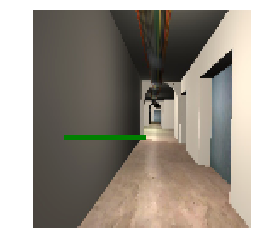

time: 19.38.51, run: 00000_esatv3, frame: 138, loss: 0.325173765421


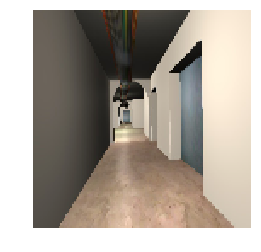

time: 19.38.51, run: 00000_esatv3, frame: 139, loss: 0.337488114834


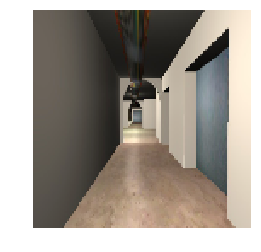

time: 19.38.52, run: 00000_esatv3, frame: 140, loss: 0.318325191736


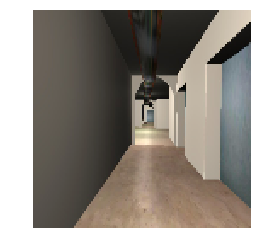

time: 19.38.52, run: 00000_esatv3, frame: 141, loss: 0.326633095741


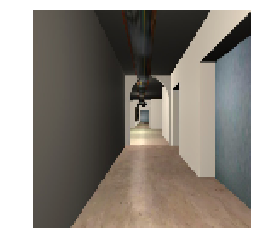

time: 19.38.52, run: 00000_esatv3, frame: 142, loss: 0.310892730951


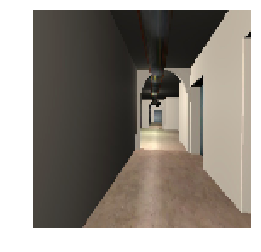

time: 19.38.52, run: 00000_esatv3, frame: 143, loss: 0.316875010729


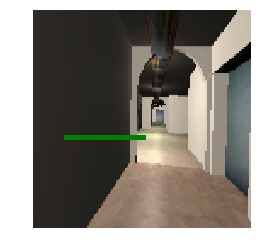

time: 19.38.52, run: 00000_esatv3, frame: 144, loss: 0.308765292168


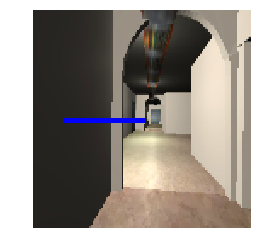

time: 19.38.52, run: 00000_esatv3, frame: 145, loss: 0.323359847069


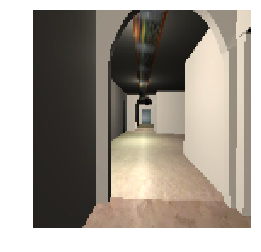

time: 19.38.53, run: 00000_esatv3, frame: 146, loss: 0.314401060343


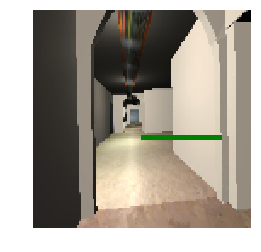

time: 19.38.53, run: 00000_esatv3, frame: 147, loss: 0.330581456423


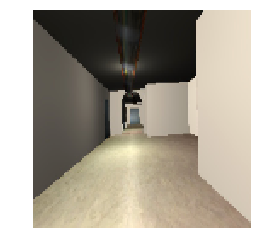

time: 19.38.53, run: 00000_esatv3, frame: 148, loss: 0.314952582121


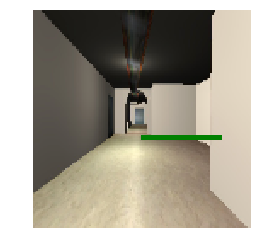

time: 19.38.53, run: 00000_esatv3, frame: 149, loss: 0.382113724947


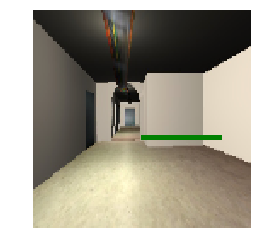

time: 19.38.53, run: 00000_esatv3, frame: 150, loss: 0.439595758915


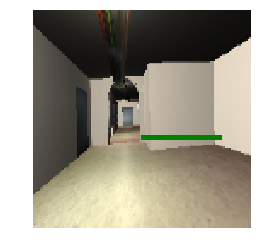

time: 19.38.53, run: 00000_esatv3, frame: 151, loss: 0.511432826519


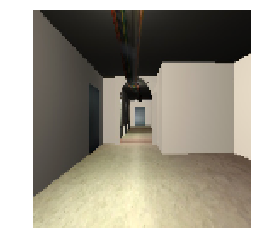

time: 19.38.54, run: 00000_esatv3, frame: 152, loss: 0.481046140194


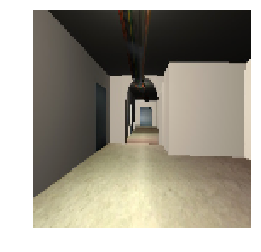

time: 19.38.54, run: 00000_esatv3, frame: 153, loss: 0.474993109703


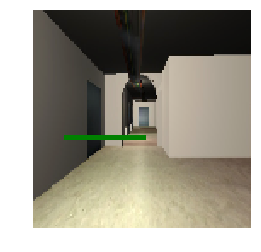

time: 19.38.54, run: 00000_esatv3, frame: 154, loss: 0.507621049881


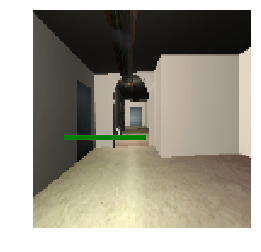

time: 19.38.54, run: 00000_esatv3, frame: 155, loss: 0.553155779839


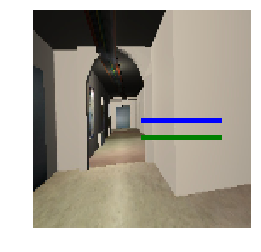

time: 19.38.54, run: 00000_esatv3, frame: 156, loss: 0.522285878658


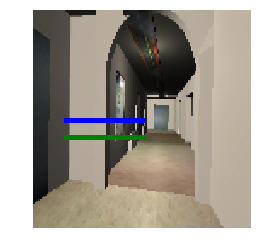

time: 19.38.55, run: 00000_esatv3, frame: 157, loss: 0.516217529774


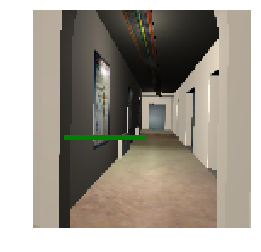

time: 19.38.55, run: 00000_esatv3, frame: 158, loss: 0.503484249115


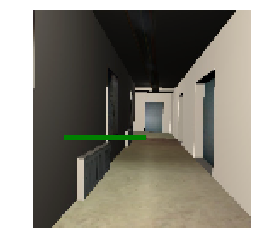

time: 19.38.55, run: 00000_esatv3, frame: 159, loss: 0.523081123829


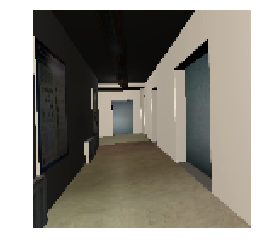

time: 19.38.55, run: 00000_esatv3, frame: 160, loss: 0.4961771667


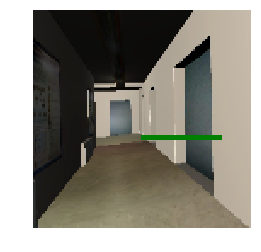

time: 19.38.55, run: 00000_esatv3, frame: 161, loss: 0.502418994904


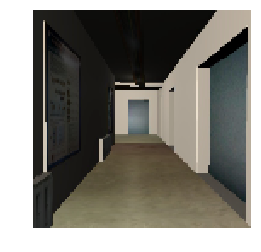

time: 19.38.56, run: 00000_esatv3, frame: 162, loss: 0.47943174839


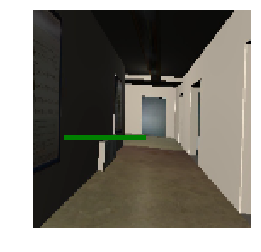

time: 19.38.56, run: 00000_esatv3, frame: 163, loss: 0.500316977501


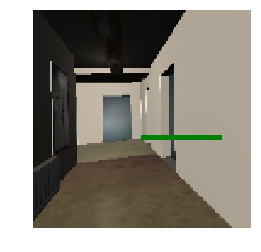

time: 19.38.56, run: 00000_esatv3, frame: 164, loss: 0.477921694517


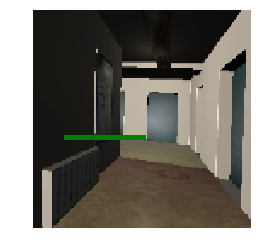

time: 19.38.56, run: 00000_esatv3, frame: 165, loss: 0.488885223866


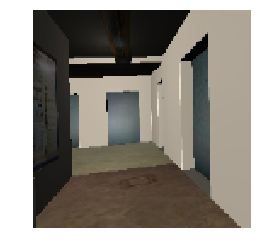

time: 19.38.56, run: 00000_esatv3, frame: 166, loss: 0.467964410782


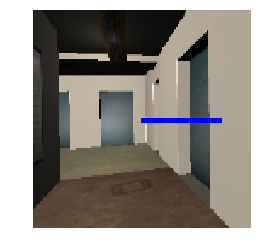

time: 19.38.56, run: 00000_esatv3, frame: 167, loss: 0.474386304617


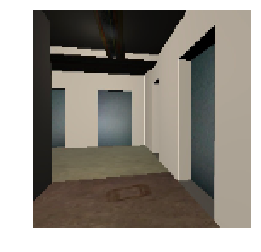

time: 19.38.57, run: 00000_esatv3, frame: 168, loss: 0.461901783943


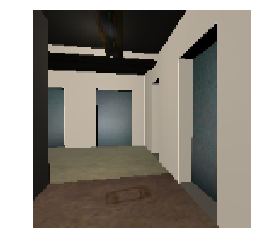

time: 19.38.57, run: 00000_esatv3, frame: 169, loss: 0.460803985596


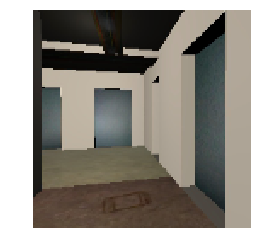

time: 19.38.57, run: 00000_esatv3, frame: 170, loss: 0.450510025024


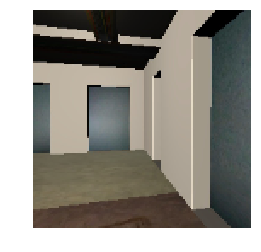

time: 19.38.57, run: 00000_esatv3, frame: 171, loss: 0.446351975203


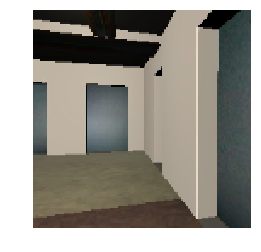

time: 19.38.57, run: 00000_esatv3, frame: 172, loss: 0.436968803406


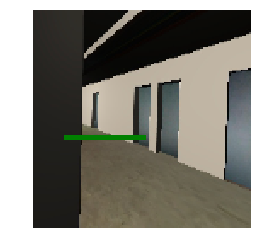

time: 19.38.58, run: 00000_esatv3, frame: 173, loss: 0.445639818907


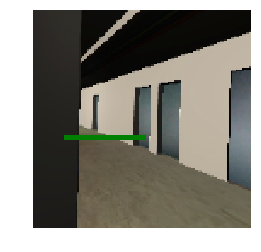

time: 19.38.58, run: 00000_esatv3, frame: 174, loss: 0.437295496464


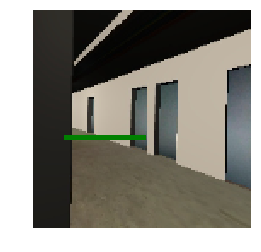

time: 19.38.58, run: 00000_esatv3, frame: 175, loss: 0.45509031415


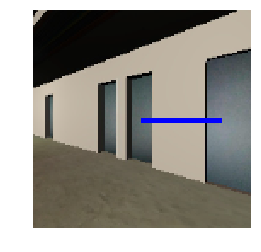

time: 19.38.58, run: 00000_esatv3, frame: 176, loss: 0.436279863119


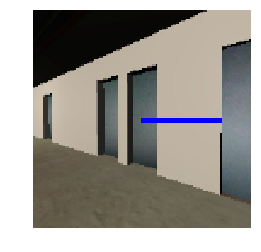

time: 19.38.58, run: 00000_esatv3, frame: 177, loss: 0.45059221983


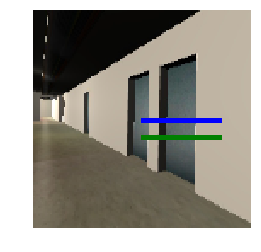

time: 19.38.59, run: 00000_esatv3, frame: 178, loss: 0.431516557932


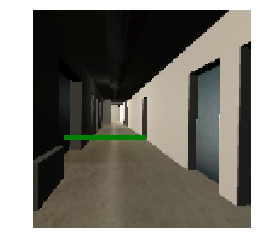

time: 19.38.59, run: 00000_esatv3, frame: 179, loss: 0.456066817045


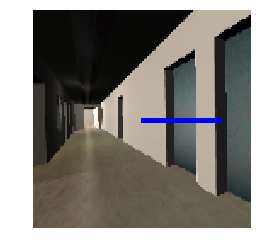

time: 19.38.59, run: 00000_esatv3, frame: 180, loss: 0.439597576857


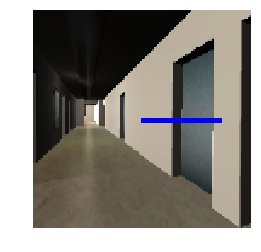

time: 19.38.59, run: 00000_esatv3, frame: 181, loss: 0.451572090387


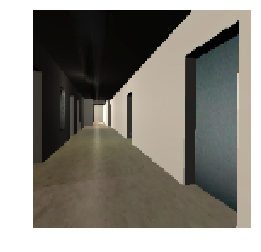

time: 19.38.59, run: 00000_esatv3, frame: 182, loss: 0.442935138941


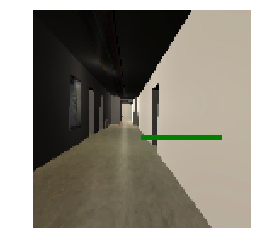

time: 19.39.00, run: 00000_esatv3, frame: 183, loss: 0.447226524353


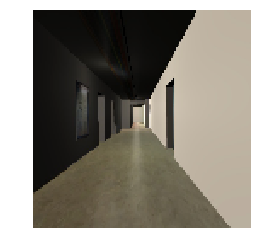

time: 19.39.00, run: 00000_esatv3, frame: 184, loss: 0.433684110641


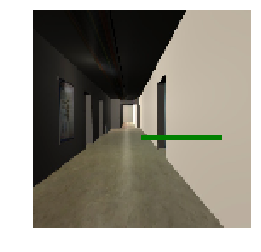

time: 19.39.00, run: 00000_esatv3, frame: 185, loss: 0.442464798689


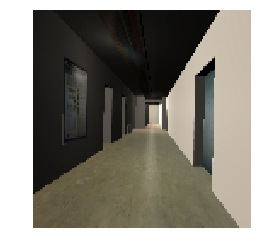

time: 19.39.00, run: 00000_esatv3, frame: 186, loss: 0.428111284971


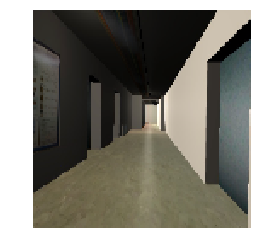

time: 19.39.01, run: 00000_esatv3, frame: 187, loss: 0.430404096842


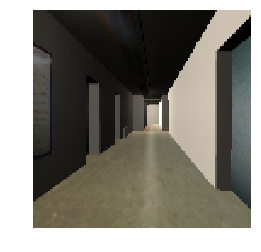

time: 19.39.01, run: 00000_esatv3, frame: 188, loss: 0.418406248093


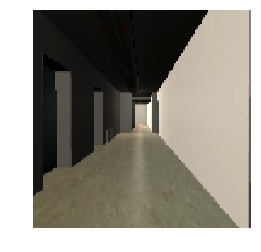

time: 19.39.01, run: 00000_esatv3, frame: 189, loss: 0.419612765312


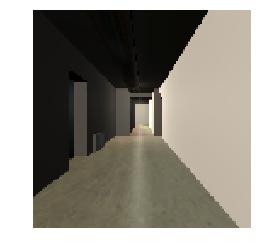

time: 19.39.01, run: 00000_esatv3, frame: 190, loss: 0.410140275955


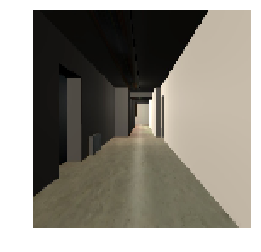

time: 19.39.01, run: 00000_esatv3, frame: 191, loss: 0.409846782684


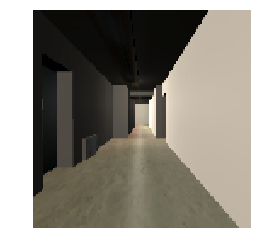

time: 19.39.02, run: 00000_esatv3, frame: 192, loss: 0.401592761278


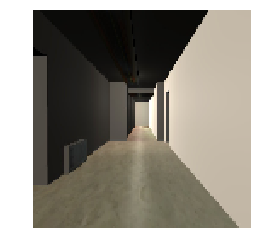

time: 19.39.02, run: 00000_esatv3, frame: 193, loss: 0.400828778744


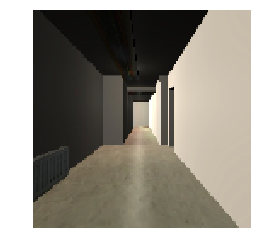

time: 19.39.02, run: 00000_esatv3, frame: 194, loss: 0.393959790468


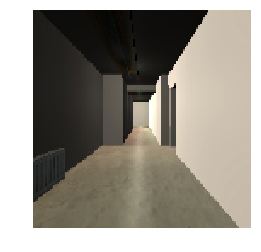

time: 19.39.02, run: 00000_esatv3, frame: 195, loss: 0.392269283533


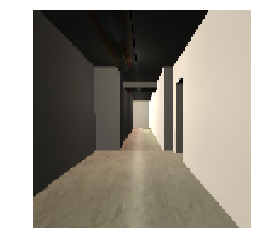

time: 19.39.02, run: 00000_esatv3, frame: 196, loss: 0.386300414801


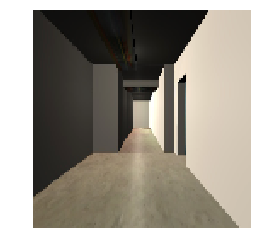

time: 19.39.03, run: 00000_esatv3, frame: 197, loss: 0.384366393089


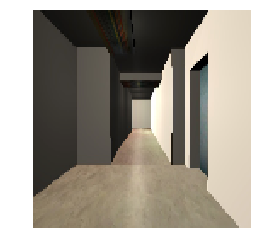

time: 19.39.03, run: 00000_esatv3, frame: 198, loss: 0.379224389791


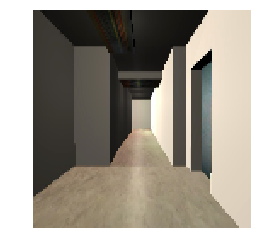

time: 19.39.03, run: 00000_esatv3, frame: 199, loss: 0.376958996058


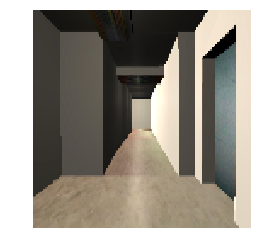

time: 19.39.03, run: 00000_esatv3, frame: 200, loss: 0.371883004904


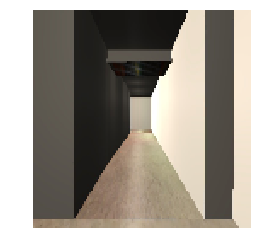

time: 19.39.03, run: 00000_esatv3, frame: 201, loss: 0.369402438402


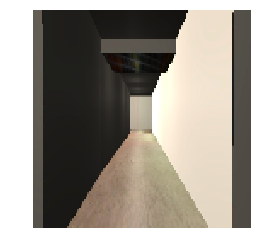

time: 19.39.04, run: 00000_esatv3, frame: 202, loss: 0.364236027002


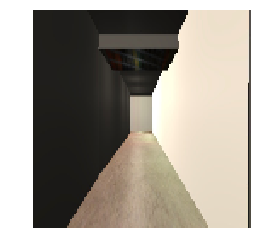

time: 19.39.04, run: 00000_esatv3, frame: 203, loss: 0.362279117107


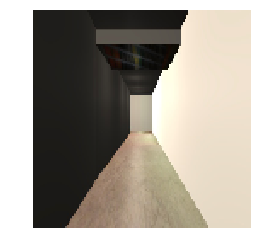

time: 19.39.04, run: 00000_esatv3, frame: 204, loss: 0.356986731291


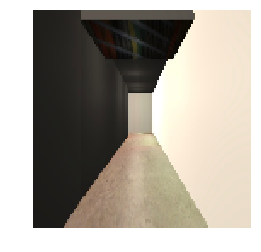

time: 19.39.04, run: 00000_esatv3, frame: 205, loss: 0.355308681726


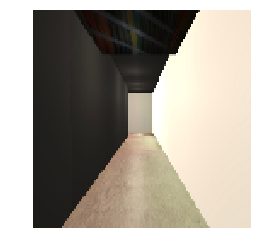

time: 19.39.05, run: 00000_esatv3, frame: 206, loss: 0.349898397923


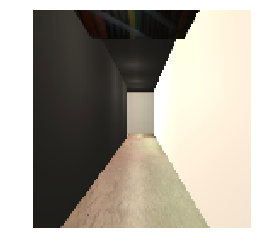

time: 19.39.05, run: 00000_esatv3, frame: 207, loss: 0.348593771458


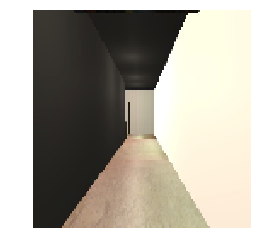

time: 19.39.05, run: 00000_esatv3, frame: 208, loss: 0.343138456345


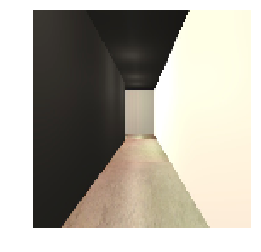

time: 19.39.05, run: 00000_esatv3, frame: 209, loss: 0.342156171799


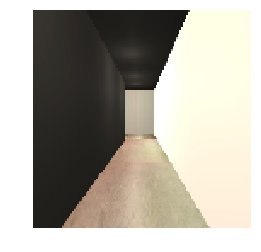

time: 19.39.05, run: 00000_esatv3, frame: 210, loss: 0.33677315712


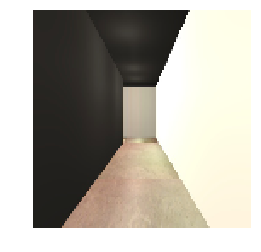

time: 19.39.06, run: 00000_esatv3, frame: 211, loss: 0.335994869471


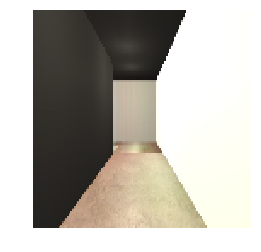

time: 19.39.06, run: 00000_esatv3, frame: 212, loss: 0.330742239952


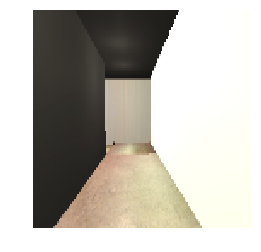

time: 19.39.06, run: 00000_esatv3, frame: 213, loss: 0.330163091421


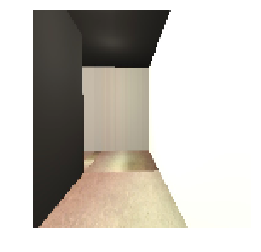

time: 19.39.06, run: 00000_esatv3, frame: 214, loss: 0.325810462236


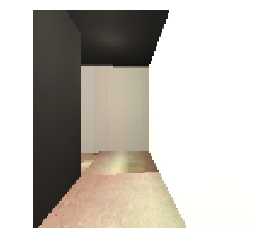

time: 19.39.06, run: 00000_esatv3, frame: 215, loss: 0.325171291828


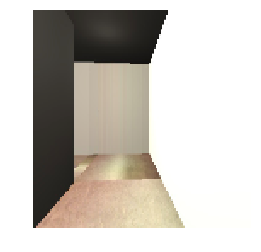

time: 19.39.07, run: 00000_esatv3, frame: 216, loss: 0.321219682693


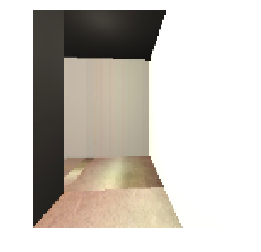

time: 19.39.07, run: 00000_esatv3, frame: 217, loss: 0.319973528385


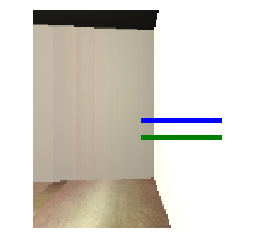

time: 19.39.07, run: 00000_esatv3, frame: 218, loss: 0.318295329809


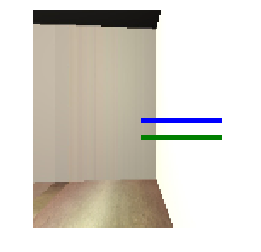

time: 19.39.07, run: 00000_esatv3, frame: 219, loss: 0.320692002773


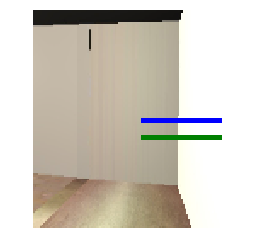

time: 19.39.07, run: 00000_esatv3, frame: 220, loss: 0.317752480507


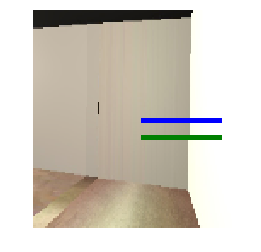

time: 19.39.08, run: 00000_esatv3, frame: 221, loss: 0.319712460041


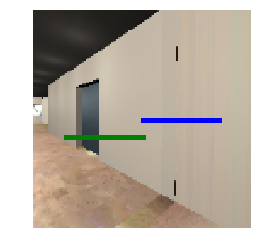

time: 19.39.08, run: 00000_esatv3, frame: 222, loss: 0.325311839581


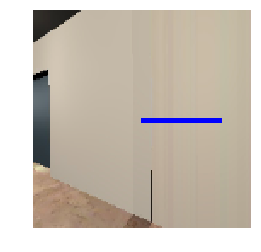

time: 19.39.08, run: 00000_esatv3, frame: 223, loss: 0.332549124956


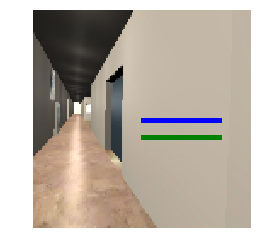

time: 19.39.08, run: 00000_esatv3, frame: 224, loss: 0.326050370932


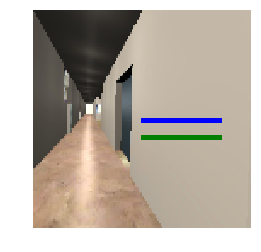

time: 19.39.09, run: 00000_esatv3, frame: 225, loss: 0.327704519033


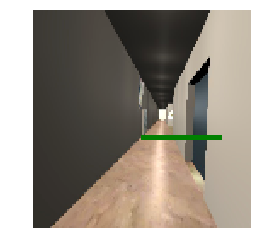

time: 19.39.09, run: 00000_esatv3, frame: 226, loss: 0.347745507956


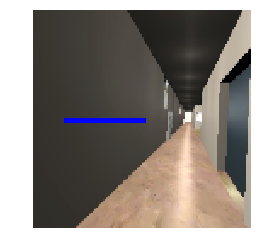

time: 19.39.09, run: 00000_esatv3, frame: 227, loss: 0.353418052197


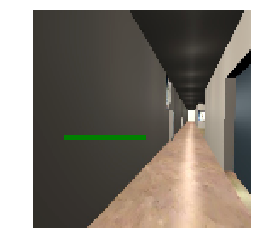

time: 19.39.09, run: 00000_esatv3, frame: 228, loss: 0.347771495581


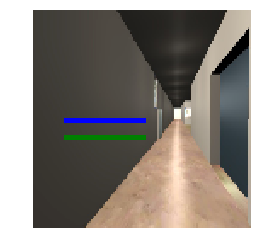

time: 19.39.09, run: 00000_esatv3, frame: 229, loss: 0.355161398649


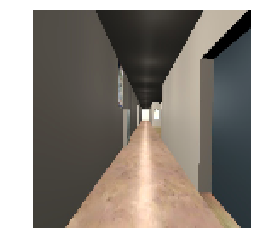

time: 19.39.10, run: 00000_esatv3, frame: 230, loss: 0.344323515892


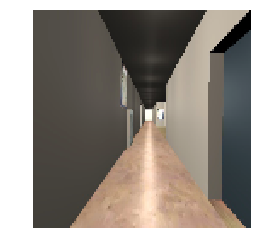

time: 19.39.10, run: 00000_esatv3, frame: 231, loss: 0.350240409374


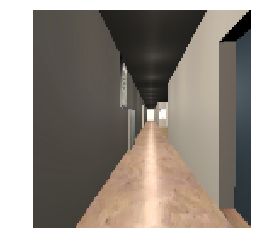

time: 19.39.10, run: 00000_esatv3, frame: 232, loss: 0.343747198582


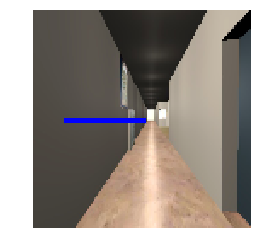

time: 19.39.10, run: 00000_esatv3, frame: 233, loss: 0.346963226795


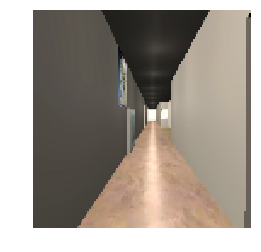

time: 19.39.10, run: 00000_esatv3, frame: 234, loss: 0.345121413469


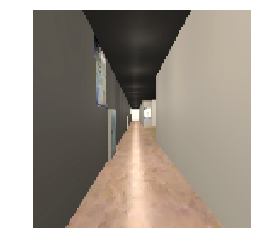

time: 19.39.11, run: 00000_esatv3, frame: 235, loss: 0.343243956566


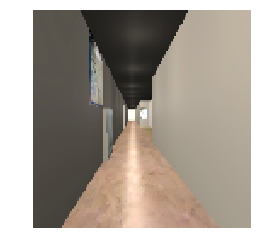

time: 19.39.11, run: 00000_esatv3, frame: 236, loss: 0.341385066509


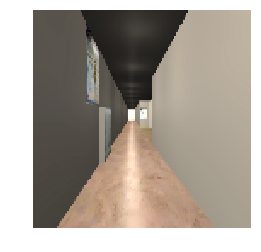

time: 19.39.11, run: 00000_esatv3, frame: 237, loss: 0.339301973581


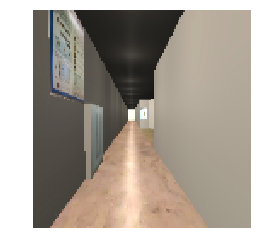

time: 19.39.11, run: 00000_esatv3, frame: 238, loss: 0.33957234025


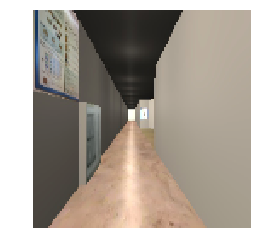

time: 19.39.12, run: 00000_esatv3, frame: 239, loss: 0.335999786854


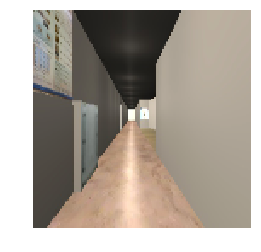

time: 19.39.12, run: 00000_esatv3, frame: 240, loss: 0.336511254311


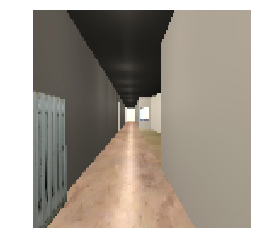

time: 19.39.12, run: 00000_esatv3, frame: 241, loss: 0.332532137632


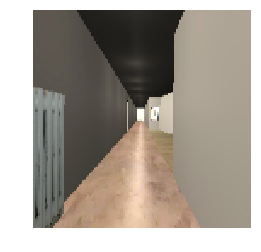

time: 19.39.12, run: 00000_esatv3, frame: 242, loss: 0.332995027304


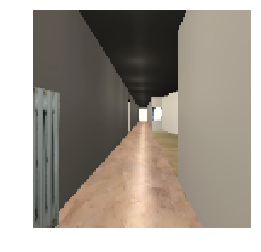

time: 19.39.13, run: 00000_esatv3, frame: 243, loss: 0.327863067389


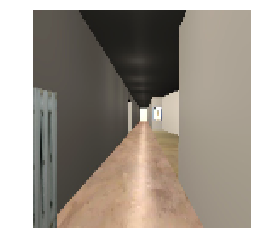

time: 19.39.13, run: 00000_esatv3, frame: 244, loss: 0.328045338392


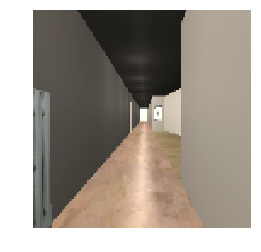

time: 19.39.13, run: 00000_esatv3, frame: 245, loss: 0.323251098394


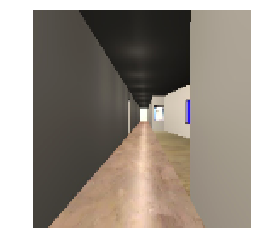

time: 19.39.13, run: 00000_esatv3, frame: 246, loss: 0.323086380959


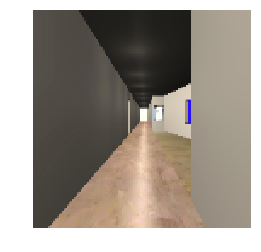

time: 19.39.14, run: 00000_esatv3, frame: 247, loss: 0.318731844425


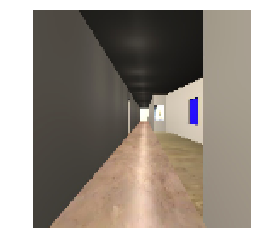

time: 19.39.14, run: 00000_esatv3, frame: 248, loss: 0.318386852741


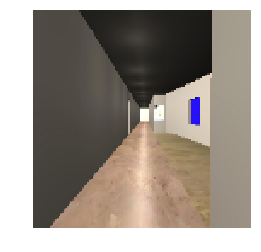

time: 19.39.14, run: 00000_esatv3, frame: 249, loss: 0.314402043819


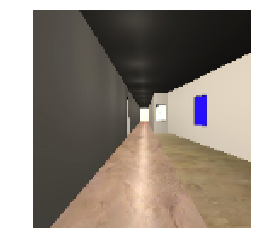

time: 19.39.14, run: 00000_esatv3, frame: 250, loss: 0.313998311758


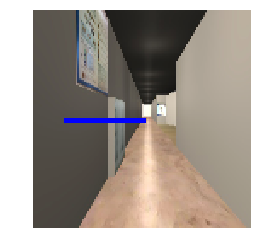

time: 19.39.14, run: 00002_esatv3, frame: 0, loss: 0.311586976051


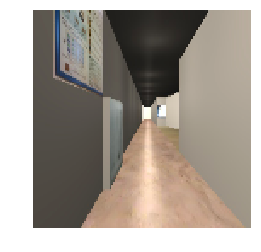

time: 19.39.15, run: 00002_esatv3, frame: 1, loss: 0.315190076828


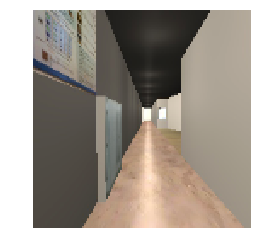

time: 19.39.15, run: 00002_esatv3, frame: 2, loss: 0.308807402849


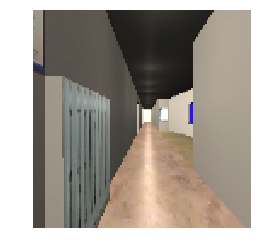

time: 19.39.15, run: 00002_esatv3, frame: 3, loss: 0.312129884958


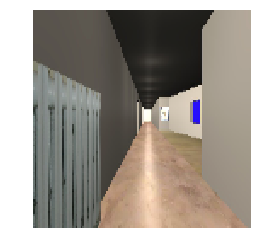

time: 19.39.15, run: 00002_esatv3, frame: 4, loss: 0.304954558611


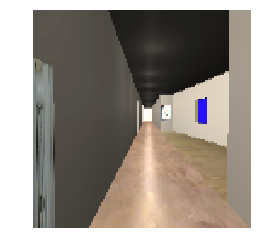

time: 19.39.16, run: 00002_esatv3, frame: 5, loss: 0.307992398739


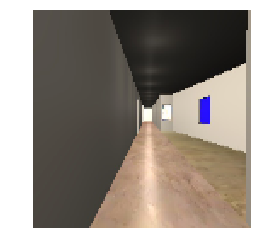

time: 19.39.16, run: 00002_esatv3, frame: 6, loss: 0.300992846489


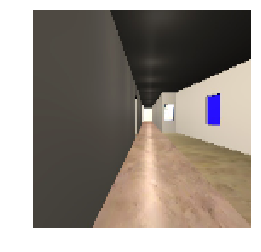

time: 19.39.16, run: 00002_esatv3, frame: 7, loss: 0.304415613413


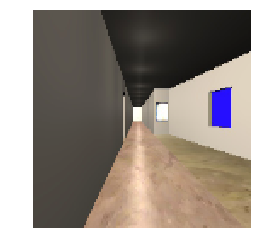

time: 19.39.16, run: 00002_esatv3, frame: 8, loss: 0.297213345766


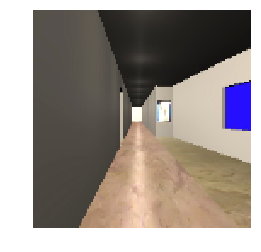

time: 19.39.17, run: 00002_esatv3, frame: 9, loss: 0.300833165646


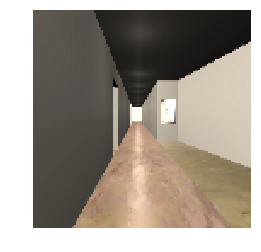

time: 19.39.17, run: 00002_esatv3, frame: 10, loss: 0.293577164412
calculate importance weights
[tools] calculate_importance_weights
0
100
200
[tools] duration 0.976320981979


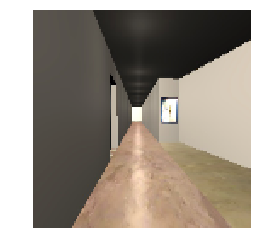

time: 19.39.18, run: 00002_esatv3, frame: 11, loss: 0.297071099281


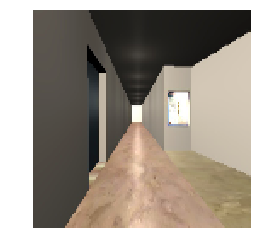

time: 19.39.18, run: 00002_esatv3, frame: 12, loss: 0.289806962013


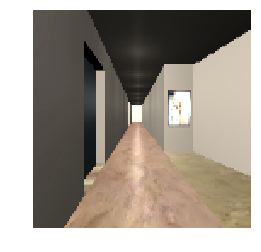

time: 19.39.19, run: 00002_esatv3, frame: 13, loss: 0.293268352747


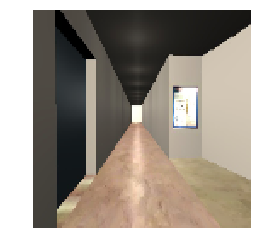

time: 19.39.19, run: 00002_esatv3, frame: 14, loss: 0.286458194256


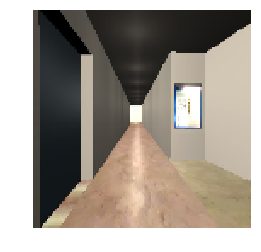

time: 19.39.19, run: 00002_esatv3, frame: 15, loss: 0.291577637196


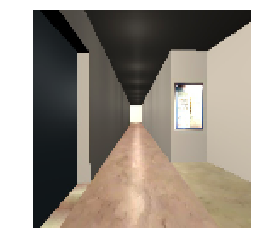

time: 19.39.19, run: 00002_esatv3, frame: 16, loss: 0.282927751541


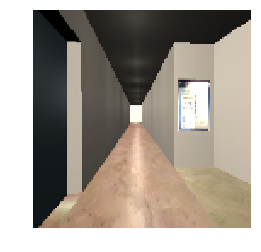

time: 19.39.20, run: 00002_esatv3, frame: 17, loss: 0.287947803736


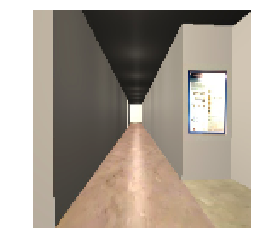

time: 19.39.20, run: 00002_esatv3, frame: 18, loss: 0.279408097267


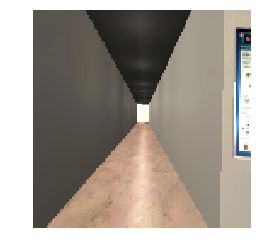

time: 19.39.20, run: 00002_esatv3, frame: 19, loss: 0.284063369036


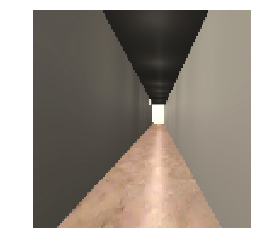

time: 19.39.20, run: 00002_esatv3, frame: 20, loss: 0.276014328003


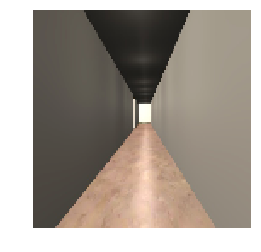

time: 19.39.21, run: 00002_esatv3, frame: 21, loss: 0.280884176493


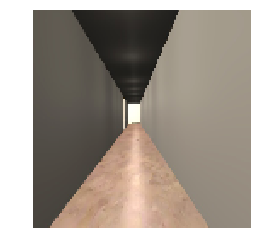

time: 19.39.21, run: 00002_esatv3, frame: 22, loss: 0.27268460393


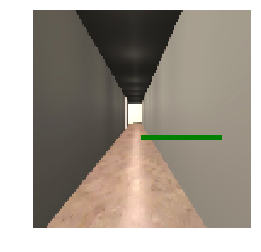

time: 19.39.21, run: 00002_esatv3, frame: 23, loss: 0.284843951464


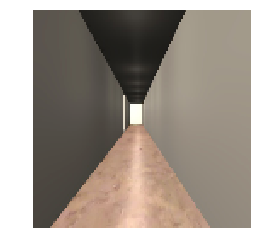

time: 19.39.21, run: 00002_esatv3, frame: 24, loss: 0.280112564564


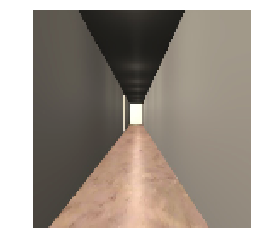

time: 19.39.22, run: 00002_esatv3, frame: 25, loss: 0.281289070845


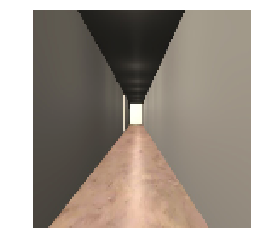

time: 19.39.22, run: 00002_esatv3, frame: 26, loss: 0.276768267155


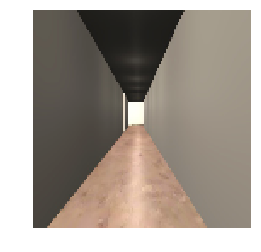

time: 19.39.22, run: 00002_esatv3, frame: 27, loss: 0.277814000845


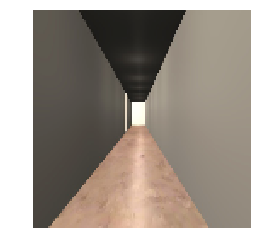

time: 19.39.22, run: 00002_esatv3, frame: 28, loss: 0.2735273242


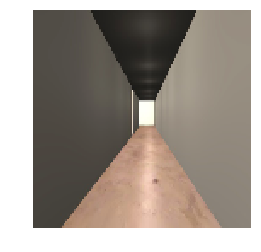

time: 19.39.23, run: 00002_esatv3, frame: 29, loss: 0.274495095015


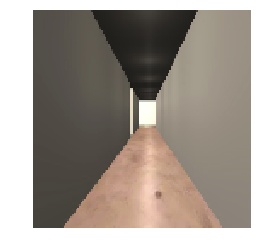

time: 19.39.23, run: 00002_esatv3, frame: 30, loss: 0.270375788212


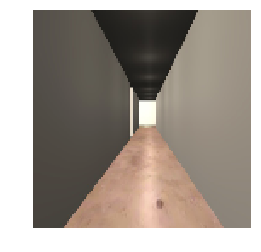

time: 19.39.23, run: 00002_esatv3, frame: 31, loss: 0.2715087533


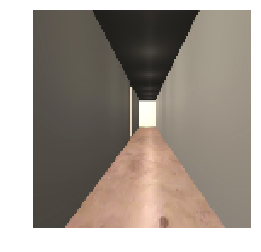

time: 19.39.24, run: 00002_esatv3, frame: 32, loss: 0.267365843058


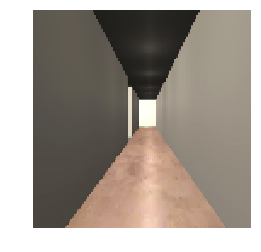

time: 19.39.24, run: 00002_esatv3, frame: 33, loss: 0.26880183816


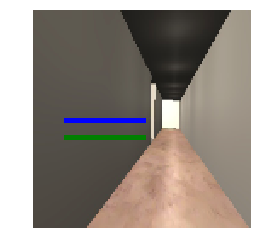

time: 19.39.24, run: 00002_esatv3, frame: 34, loss: 0.267804592848


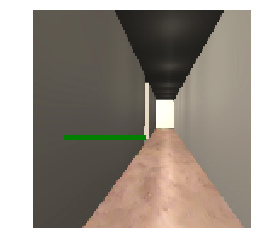

time: 19.39.24, run: 00002_esatv3, frame: 35, loss: 0.267696231604


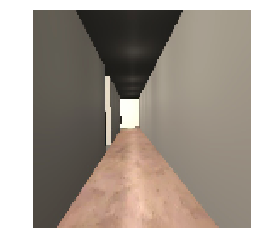

time: 19.39.25, run: 00002_esatv3, frame: 36, loss: 0.268667072058


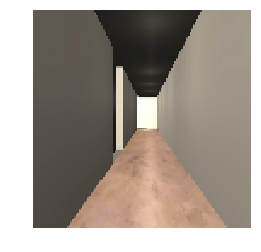

time: 19.39.25, run: 00002_esatv3, frame: 37, loss: 0.265147477388


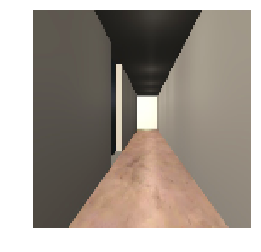

time: 19.39.25, run: 00002_esatv3, frame: 38, loss: 0.265619575977


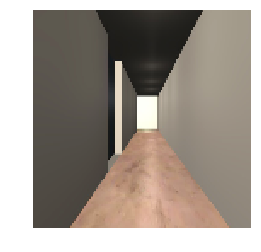

time: 19.39.25, run: 00002_esatv3, frame: 39, loss: 0.26249268651


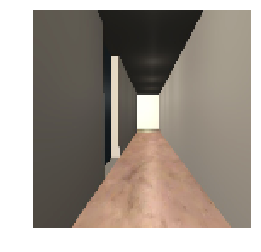

time: 19.39.26, run: 00002_esatv3, frame: 40, loss: 0.262600898743


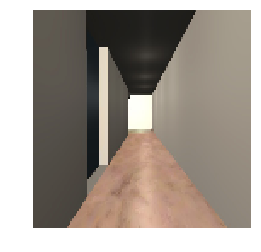

time: 19.39.26, run: 00002_esatv3, frame: 41, loss: 0.259488880634


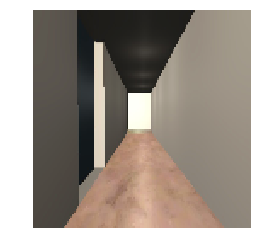

time: 19.39.26, run: 00002_esatv3, frame: 42, loss: 0.25960123539


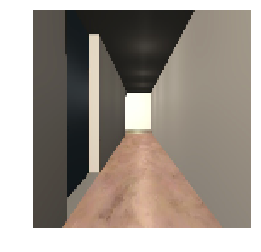

time: 19.39.26, run: 00002_esatv3, frame: 43, loss: 0.256819933653


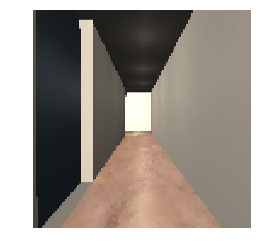

time: 19.39.27, run: 00002_esatv3, frame: 44, loss: 0.257093936205


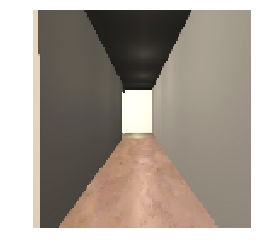

time: 19.39.27, run: 00002_esatv3, frame: 45, loss: 0.255045503378


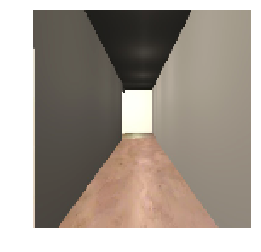

time: 19.39.27, run: 00002_esatv3, frame: 46, loss: 0.254416555166


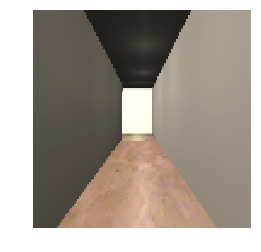

time: 19.39.27, run: 00002_esatv3, frame: 47, loss: 0.25243127346


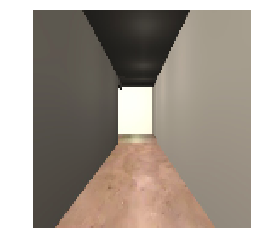

time: 19.39.28, run: 00002_esatv3, frame: 48, loss: 0.251640170813


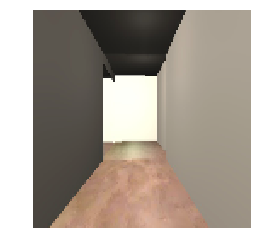

time: 19.39.28, run: 00002_esatv3, frame: 49, loss: 0.24946141243


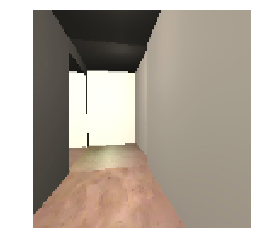

time: 19.39.28, run: 00002_esatv3, frame: 50, loss: 0.249245241284


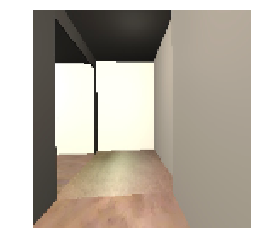

time: 19.39.28, run: 00002_esatv3, frame: 51, loss: 0.24715565145


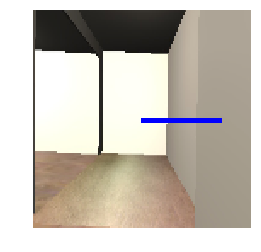

time: 19.39.29, run: 00002_esatv3, frame: 52, loss: 0.249357923865


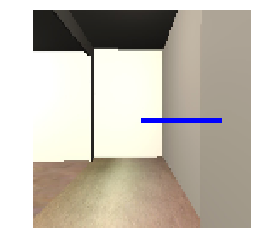

time: 19.39.29, run: 00002_esatv3, frame: 53, loss: 0.252355068922


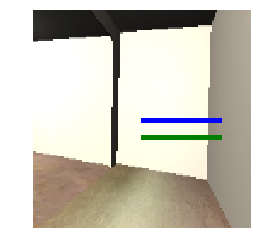

time: 19.39.29, run: 00002_esatv3, frame: 54, loss: 0.250324577093


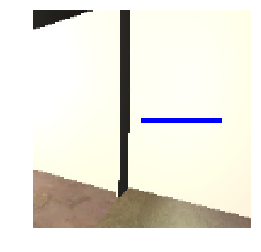

time: 19.39.29, run: 00002_esatv3, frame: 55, loss: 0.251987606287


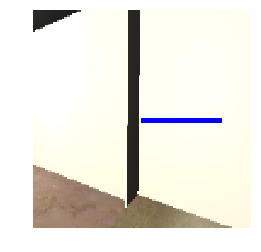

time: 19.39.30, run: 00002_esatv3, frame: 56, loss: 0.254689872265


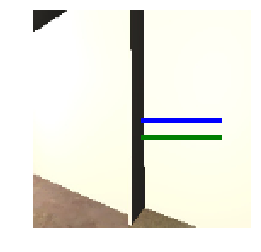

time: 19.39.30, run: 00002_esatv3, frame: 57, loss: 0.25540715456


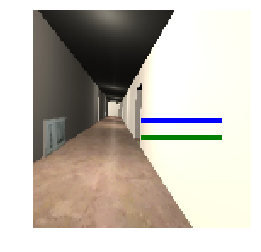

time: 19.39.30, run: 00002_esatv3, frame: 58, loss: 0.25401237607


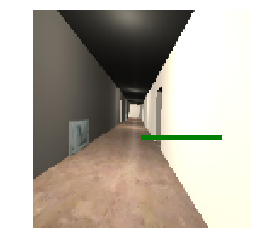

time: 19.39.30, run: 00002_esatv3, frame: 59, loss: 0.253270179033


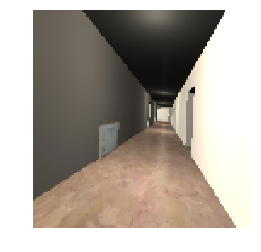

time: 19.39.31, run: 00002_esatv3, frame: 60, loss: 0.253887087107


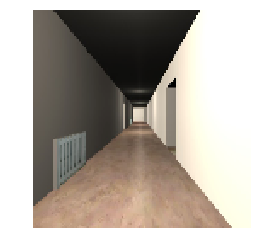

time: 19.39.31, run: 00002_esatv3, frame: 61, loss: 0.251677006483


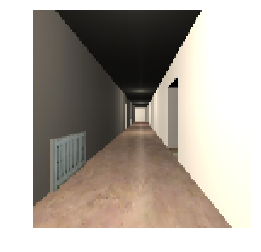

time: 19.39.31, run: 00002_esatv3, frame: 62, loss: 0.251290053129


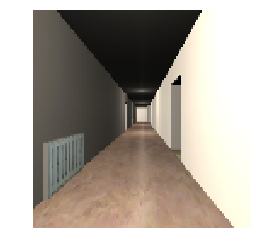

time: 19.39.31, run: 00002_esatv3, frame: 63, loss: 0.249555647373


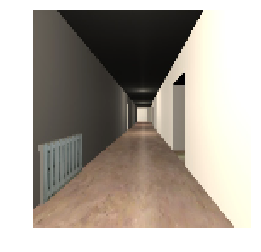

time: 19.39.32, run: 00002_esatv3, frame: 64, loss: 0.248716980219


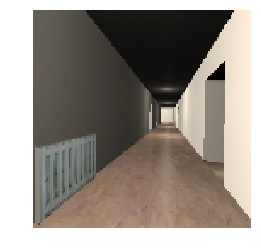

time: 19.39.32, run: 00002_esatv3, frame: 65, loss: 0.253217637539


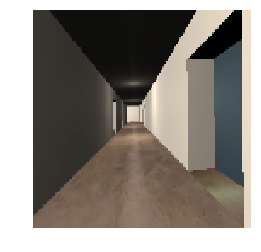

time: 19.39.32, run: 00002_esatv3, frame: 66, loss: 0.247988402843


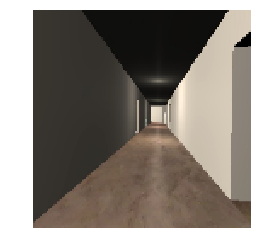

time: 19.39.32, run: 00002_esatv3, frame: 67, loss: 0.250499308109


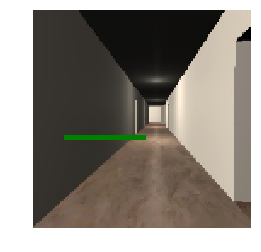

time: 19.39.33, run: 00002_esatv3, frame: 68, loss: 0.257110655308


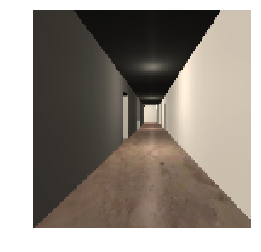

time: 19.39.33, run: 00002_esatv3, frame: 69, loss: 0.25288194418


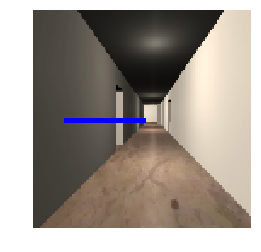

time: 19.39.33, run: 00002_esatv3, frame: 70, loss: 0.255383223295


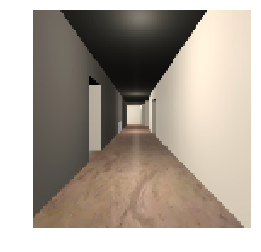

time: 19.39.34, run: 00002_esatv3, frame: 71, loss: 0.254612773657


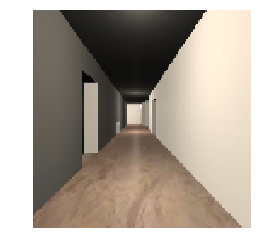

time: 19.39.34, run: 00002_esatv3, frame: 72, loss: 0.253544151783


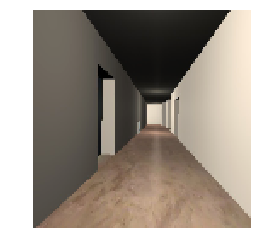

time: 19.39.34, run: 00002_esatv3, frame: 73, loss: 0.254644960165


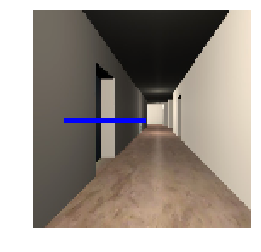

time: 19.39.34, run: 00002_esatv3, frame: 74, loss: 0.2524292171


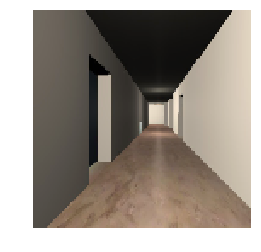

time: 19.39.35, run: 00002_esatv3, frame: 75, loss: 0.26059922576


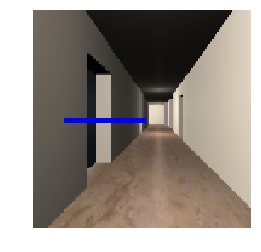

time: 19.39.35, run: 00002_esatv3, frame: 76, loss: 0.253648340702


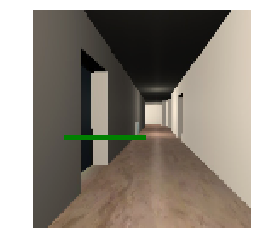

time: 19.39.35, run: 00002_esatv3, frame: 77, loss: 0.262552589178


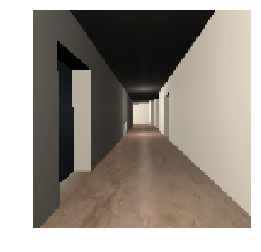

time: 19.39.36, run: 00002_esatv3, frame: 78, loss: 0.252608716488


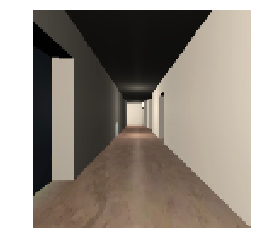

time: 19.39.36, run: 00002_esatv3, frame: 79, loss: 0.2596398592


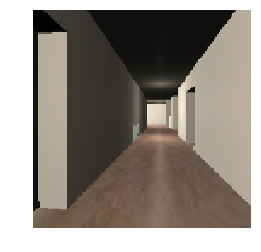

time: 19.39.36, run: 00002_esatv3, frame: 80, loss: 0.249761551619


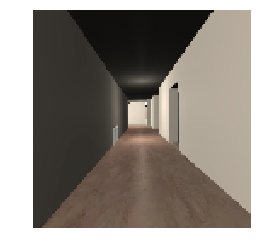

time: 19.39.36, run: 00002_esatv3, frame: 81, loss: 0.256504267454


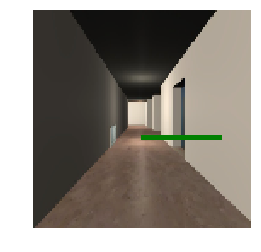

time: 19.39.37, run: 00002_esatv3, frame: 82, loss: 0.264585494995


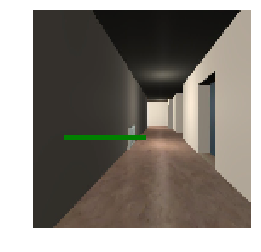

time: 19.39.37, run: 00002_esatv3, frame: 83, loss: 0.268085926771


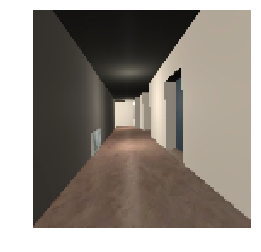

time: 19.39.37, run: 00002_esatv3, frame: 84, loss: 0.269270539284


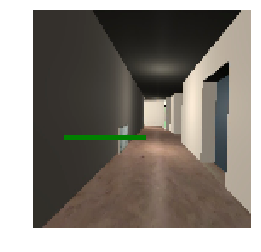

time: 19.39.37, run: 00002_esatv3, frame: 85, loss: 0.268397688866


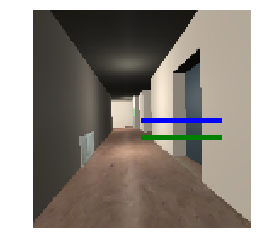

time: 19.39.38, run: 00002_esatv3, frame: 86, loss: 0.277611285448


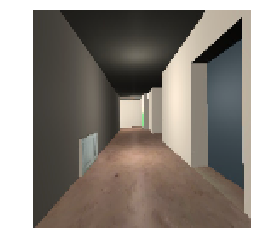

time: 19.39.38, run: 00002_esatv3, frame: 87, loss: 0.266729295254


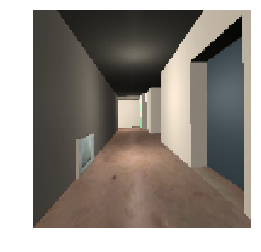

time: 19.39.38, run: 00002_esatv3, frame: 88, loss: 0.274480044842


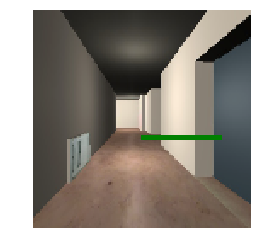

time: 19.39.39, run: 00002_esatv3, frame: 89, loss: 0.275114804506


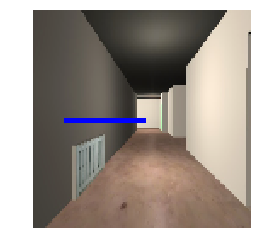

time: 19.39.39, run: 00002_esatv3, frame: 90, loss: 0.2862213552


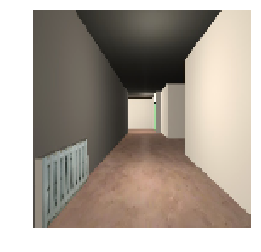

time: 19.39.39, run: 00002_esatv3, frame: 91, loss: 0.276769757271


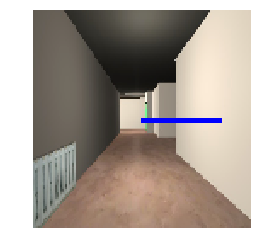

time: 19.39.39, run: 00002_esatv3, frame: 92, loss: 0.285335123539


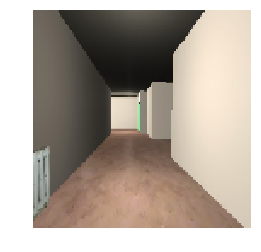

time: 19.39.40, run: 00002_esatv3, frame: 93, loss: 0.277929633856


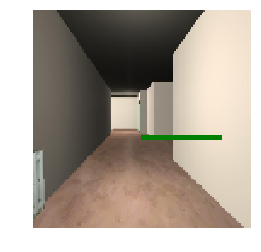

time: 19.39.40, run: 00002_esatv3, frame: 94, loss: 0.287721902132


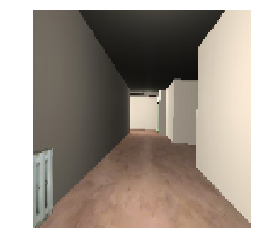

time: 19.39.40, run: 00002_esatv3, frame: 95, loss: 0.278133481741


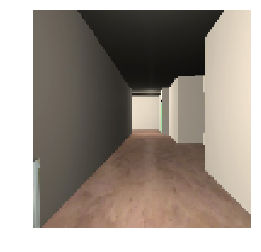

time: 19.39.41, run: 00002_esatv3, frame: 96, loss: 0.2848995924


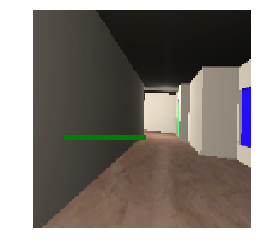

time: 19.39.41, run: 00002_esatv3, frame: 97, loss: 0.282854318619


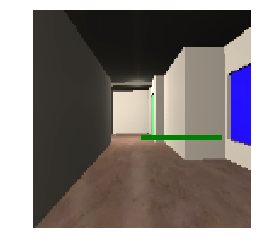

time: 19.39.41, run: 00002_esatv3, frame: 98, loss: 0.314764767885


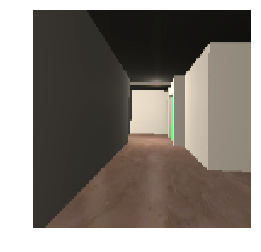

time: 19.39.41, run: 00002_esatv3, frame: 99, loss: 0.297177433968


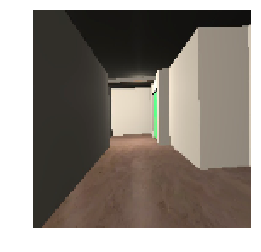

time: 19.39.42, run: 00002_esatv3, frame: 100, loss: 0.310547947884


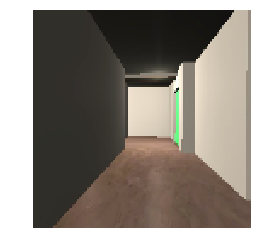

time: 19.39.42, run: 00002_esatv3, frame: 101, loss: 0.294831097126
peak detected


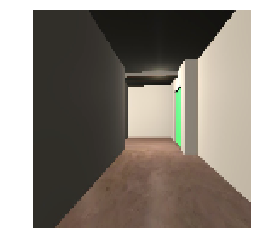

time: 19.39.42, run: 00002_esatv3, frame: 102, loss: 0.307048767805


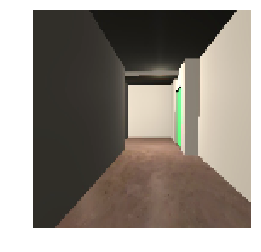

time: 19.39.42, run: 00002_esatv3, frame: 103, loss: 0.294122427702


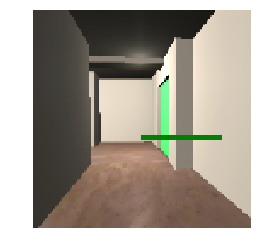

time: 19.39.43, run: 00002_esatv3, frame: 104, loss: 0.310822874308


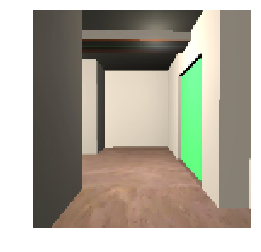

time: 19.39.43, run: 00002_esatv3, frame: 105, loss: 0.295696824789


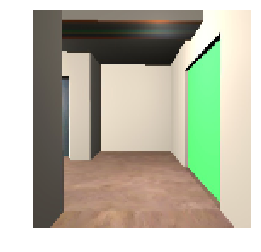

time: 19.39.43, run: 00002_esatv3, frame: 106, loss: 0.307165056467


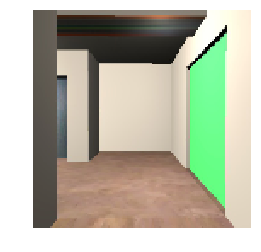

time: 19.39.44, run: 00002_esatv3, frame: 107, loss: 0.292262613773


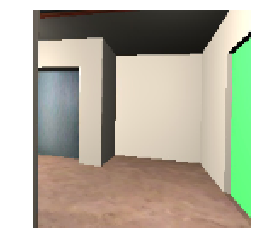

time: 19.39.44, run: 00002_esatv3, frame: 108, loss: 0.304069191217
calculate importance weights
[tools] calculate_importance_weights
0
100
200
300
[tools] duration 1.29775810242


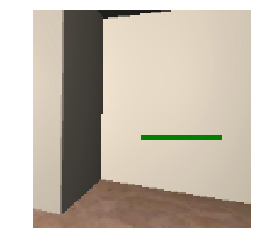

time: 19.39.45, run: 00002_esatv3, frame: 109, loss: 0.292104899883


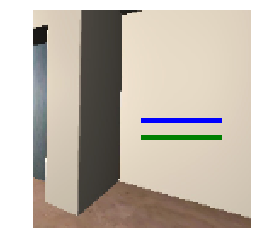

time: 19.39.46, run: 00002_esatv3, frame: 110, loss: 0.304234027863


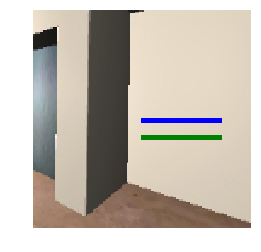

time: 19.39.46, run: 00002_esatv3, frame: 111, loss: 0.289507299662


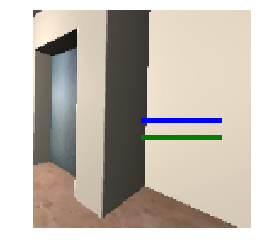

time: 19.39.46, run: 00002_esatv3, frame: 112, loss: 0.301718741655


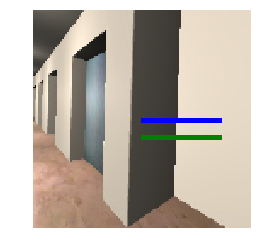

time: 19.39.47, run: 00002_esatv3, frame: 113, loss: 0.286797434092


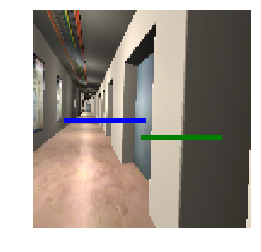

time: 19.39.47, run: 00002_esatv3, frame: 114, loss: 0.305120706558


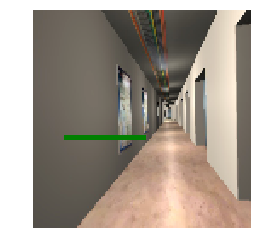

time: 19.39.47, run: 00002_esatv3, frame: 115, loss: 0.291243642569


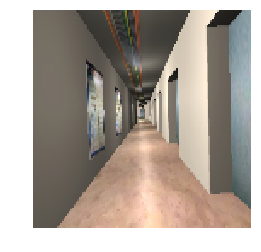

time: 19.39.48, run: 00002_esatv3, frame: 116, loss: 0.303826659918


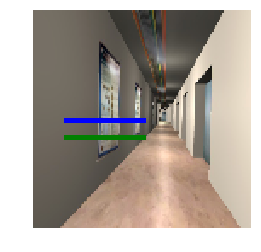

time: 19.39.48, run: 00002_esatv3, frame: 117, loss: 0.288685381413


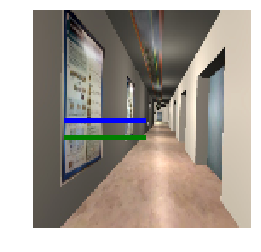

time: 19.39.48, run: 00002_esatv3, frame: 118, loss: 0.302540004253


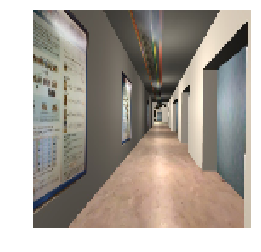

time: 19.39.48, run: 00002_esatv3, frame: 119, loss: 0.286490440369


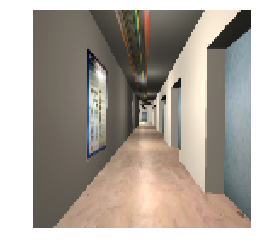

time: 19.39.49, run: 00002_esatv3, frame: 120, loss: 0.299330711365


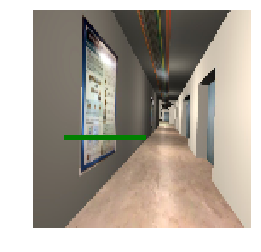

time: 19.39.49, run: 00002_esatv3, frame: 121, loss: 0.286132156849


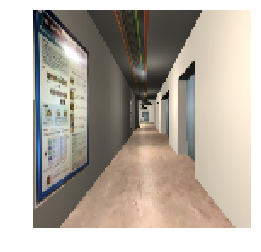

time: 19.39.49, run: 00002_esatv3, frame: 122, loss: 0.300551176071


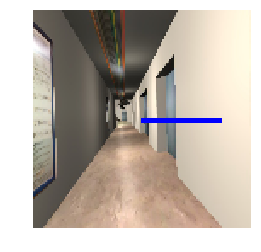

time: 19.39.50, run: 00002_esatv3, frame: 123, loss: 0.286963015795


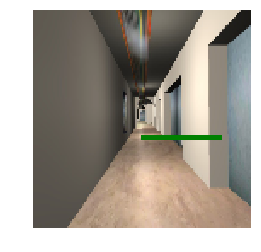

time: 19.39.50, run: 00002_esatv3, frame: 124, loss: 0.307720720768


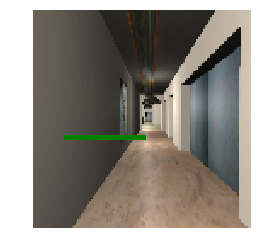

time: 19.39.50, run: 00002_esatv3, frame: 125, loss: 0.295030534267


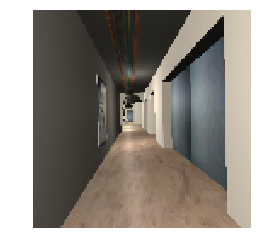

time: 19.39.50, run: 00002_esatv3, frame: 126, loss: 0.312776267529


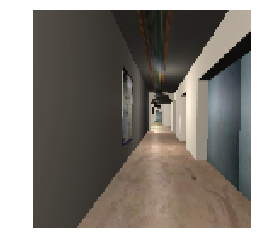

time: 19.39.51, run: 00002_esatv3, frame: 127, loss: 0.295816510916
peak detected


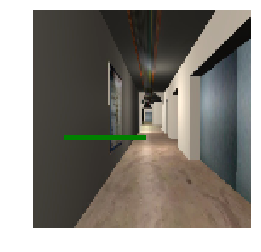

time: 19.39.51, run: 00002_esatv3, frame: 128, loss: 0.316312104464


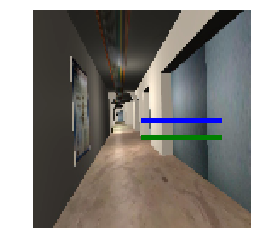

time: 19.39.51, run: 00002_esatv3, frame: 129, loss: 0.295248001814


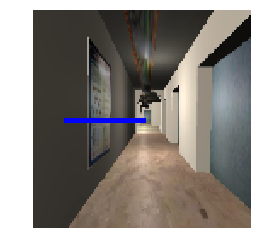

time: 19.39.52, run: 00002_esatv3, frame: 130, loss: 0.315193921328


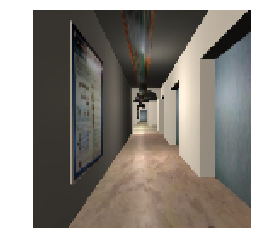

time: 19.39.52, run: 00002_esatv3, frame: 131, loss: 0.298636049032


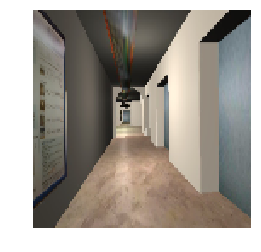

time: 19.39.52, run: 00002_esatv3, frame: 132, loss: 0.313090890646


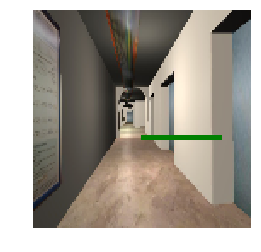

time: 19.39.52, run: 00002_esatv3, frame: 133, loss: 0.299265682697


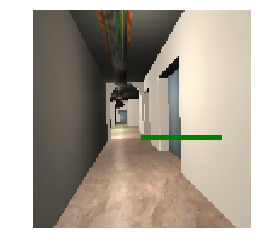

time: 19.39.53, run: 00002_esatv3, frame: 134, loss: 0.317092001438


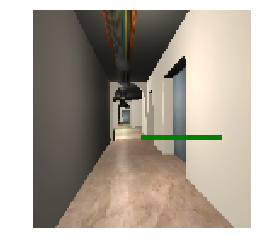

time: 19.39.53, run: 00002_esatv3, frame: 135, loss: 0.301443636417


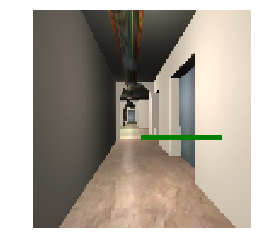

time: 19.39.53, run: 00002_esatv3, frame: 136, loss: 0.324251025915


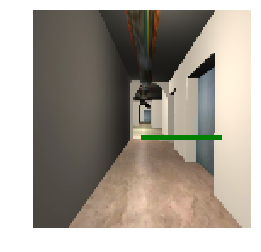

time: 19.39.54, run: 00002_esatv3, frame: 137, loss: 0.312571495771


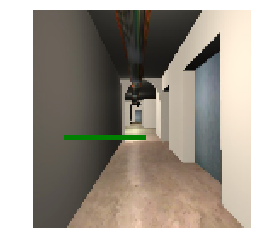

time: 19.39.54, run: 00002_esatv3, frame: 138, loss: 0.353968530893


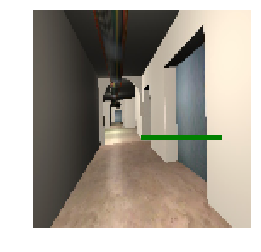

time: 19.39.54, run: 00002_esatv3, frame: 139, loss: 0.32705578208


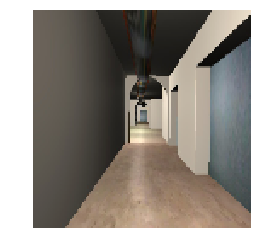

time: 19.39.55, run: 00002_esatv3, frame: 140, loss: 0.352247208357


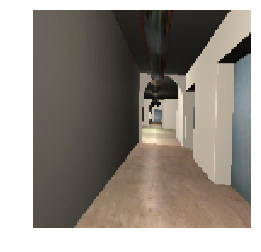

time: 19.39.55, run: 00002_esatv3, frame: 141, loss: 0.323900192976


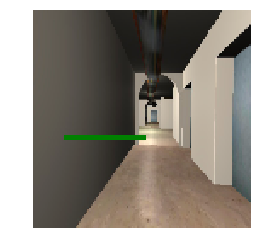

time: 19.39.55, run: 00002_esatv3, frame: 142, loss: 0.358896255493


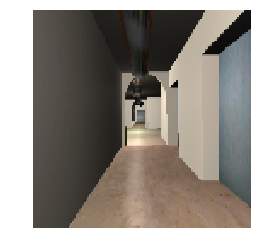

time: 19.39.56, run: 00002_esatv3, frame: 143, loss: 0.327167123556


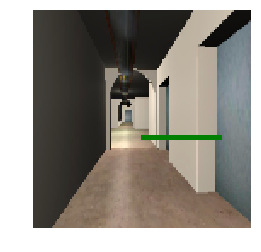

time: 19.39.56, run: 00002_esatv3, frame: 144, loss: 0.365643292665


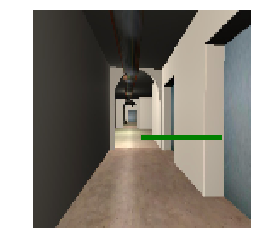

time: 19.39.56, run: 00002_esatv3, frame: 145, loss: 0.338897407055


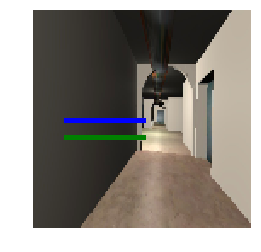

time: 19.39.57, run: 00002_esatv3, frame: 146, loss: 0.376333892345


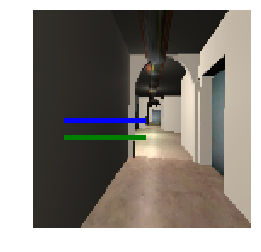

time: 19.39.57, run: 00002_esatv3, frame: 147, loss: 0.33689931035


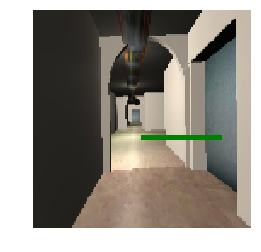

time: 19.39.57, run: 00002_esatv3, frame: 148, loss: 0.382682621479


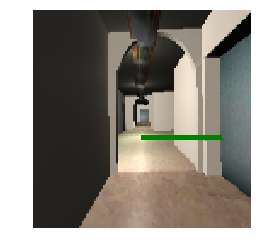

time: 19.39.57, run: 00002_esatv3, frame: 149, loss: 0.34765201807


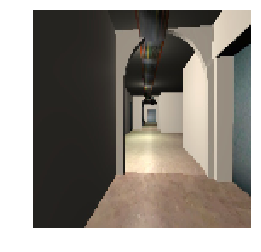

time: 19.39.58, run: 00002_esatv3, frame: 150, loss: 0.38654717803


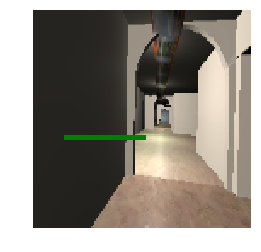

time: 19.39.58, run: 00002_esatv3, frame: 151, loss: 0.347291022539


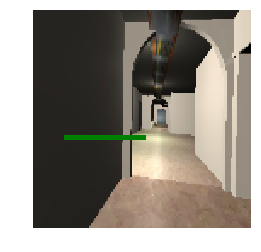

time: 19.39.58, run: 00002_esatv3, frame: 152, loss: 0.391872525215


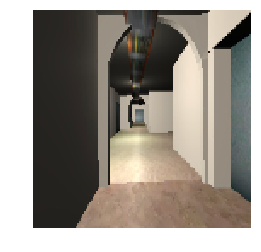

time: 19.39.59, run: 00002_esatv3, frame: 153, loss: 0.347553402185


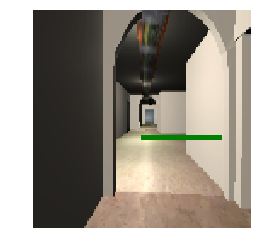

time: 19.39.59, run: 00002_esatv3, frame: 154, loss: 0.395207554102


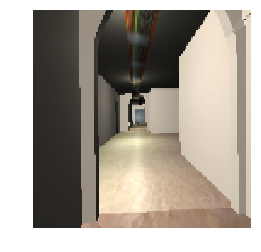

time: 19.39.59, run: 00002_esatv3, frame: 155, loss: 0.352550506592


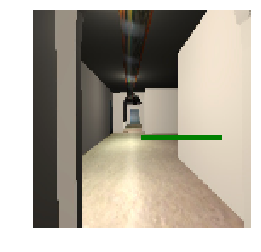

time: 19.40.00, run: 00002_esatv3, frame: 156, loss: 0.39993712306


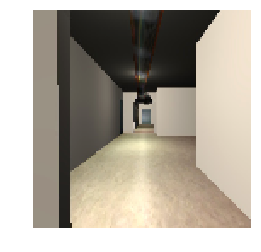

time: 19.40.00, run: 00002_esatv3, frame: 157, loss: 0.355892777443


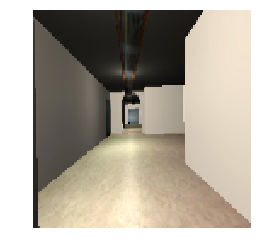

time: 19.40.00, run: 00002_esatv3, frame: 158, loss: 0.394451409578


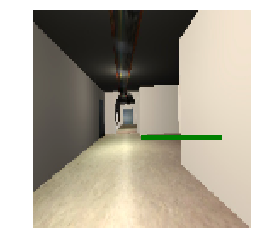

time: 19.40.01, run: 00002_esatv3, frame: 159, loss: 0.355338990688


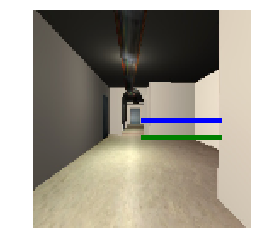

time: 19.40.01, run: 00002_esatv3, frame: 160, loss: 0.394934207201


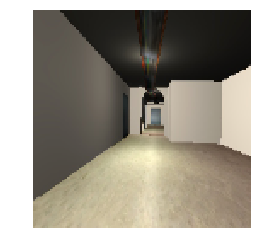

time: 19.40.01, run: 00002_esatv3, frame: 161, loss: 0.352102279663


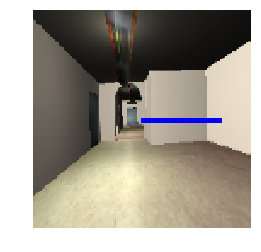

time: 19.40.01, run: 00002_esatv3, frame: 162, loss: 0.395511418581


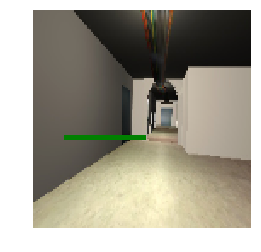

time: 19.40.02, run: 00002_esatv3, frame: 163, loss: 0.375099241734


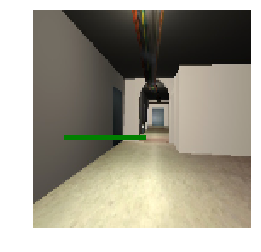

time: 19.40.02, run: 00002_esatv3, frame: 164, loss: 0.429193854332


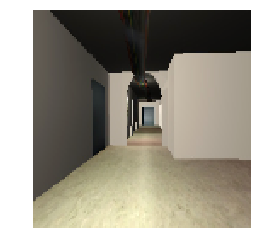

time: 19.40.02, run: 00002_esatv3, frame: 165, loss: 0.386776924133


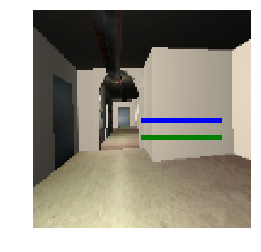

time: 19.40.03, run: 00002_esatv3, frame: 166, loss: 0.424305200577


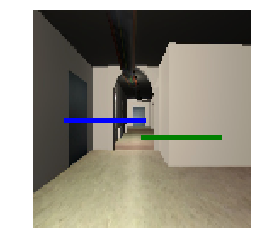

time: 19.40.03, run: 00002_esatv3, frame: 167, loss: 0.38904234767


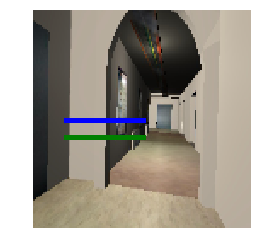

time: 19.40.03, run: 00002_esatv3, frame: 168, loss: 0.424517869949


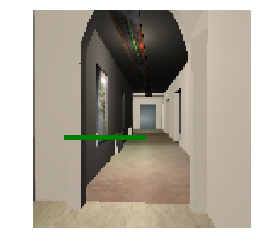

time: 19.40.04, run: 00002_esatv3, frame: 169, loss: 0.401160925627


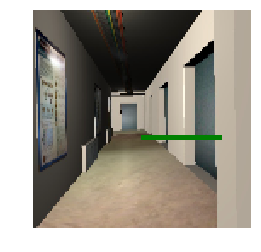

time: 19.40.04, run: 00002_esatv3, frame: 170, loss: 0.441550761461


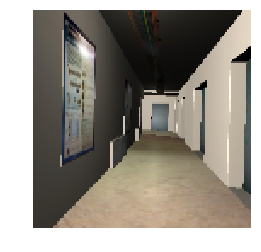

time: 19.40.04, run: 00002_esatv3, frame: 171, loss: 0.400288075209


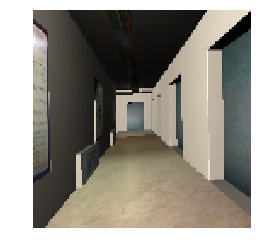

time: 19.40.04, run: 00002_esatv3, frame: 172, loss: 0.435417324305


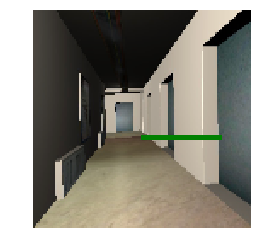

time: 19.40.05, run: 00002_esatv3, frame: 173, loss: 0.40001052618


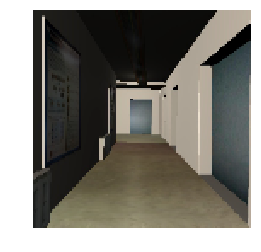

time: 19.40.05, run: 00002_esatv3, frame: 174, loss: 0.436107754707


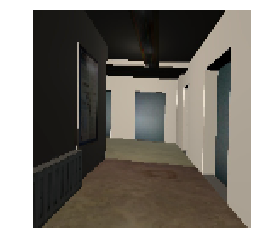

time: 19.40.05, run: 00002_esatv3, frame: 175, loss: 0.399829506874


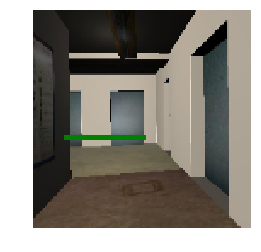

time: 19.40.06, run: 00002_esatv3, frame: 176, loss: 0.447293490171


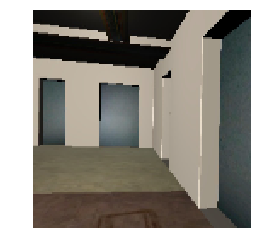

time: 19.40.06, run: 00002_esatv3, frame: 177, loss: 0.40858566761


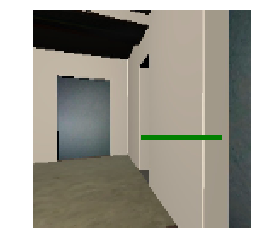

time: 19.40.06, run: 00002_esatv3, frame: 178, loss: 0.443740963936


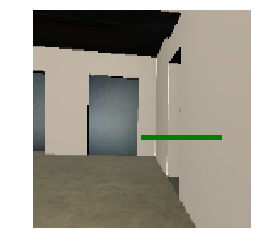

time: 19.40.07, run: 00002_esatv3, frame: 179, loss: 0.412791877985


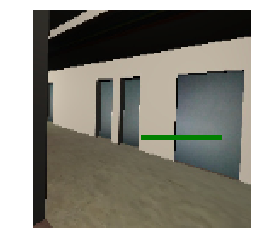

time: 19.40.07, run: 00002_esatv3, frame: 180, loss: 0.45823341608


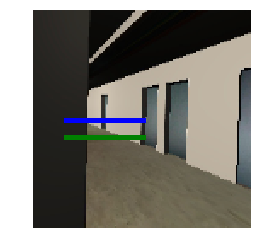

time: 19.40.07, run: 00002_esatv3, frame: 181, loss: 0.41896468401


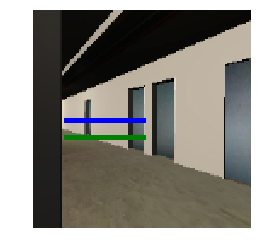

time: 19.40.08, run: 00002_esatv3, frame: 182, loss: 0.453443944454


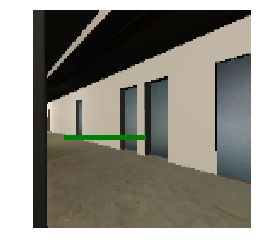

time: 19.40.08, run: 00002_esatv3, frame: 183, loss: 0.416462510824


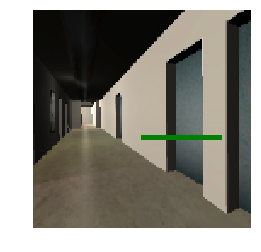

time: 19.40.08, run: 00002_esatv3, frame: 184, loss: 0.45326590538


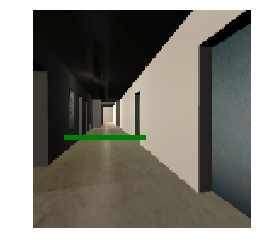

time: 19.40.09, run: 00002_esatv3, frame: 185, loss: 0.426262080669


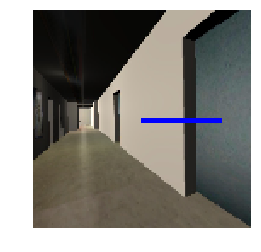

time: 19.40.09, run: 00002_esatv3, frame: 186, loss: 0.462372034788


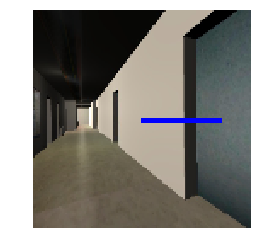

time: 19.40.09, run: 00002_esatv3, frame: 187, loss: 0.429964095354


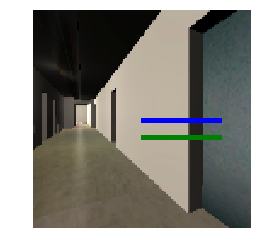

time: 19.40.10, run: 00002_esatv3, frame: 188, loss: 0.458419173956


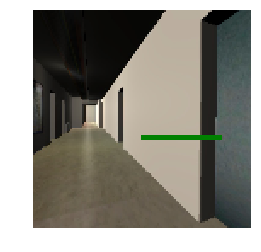

time: 19.40.10, run: 00002_esatv3, frame: 189, loss: 0.427194684744


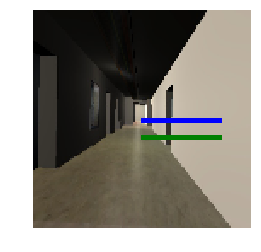

time: 19.40.10, run: 00002_esatv3, frame: 190, loss: 0.459278225899


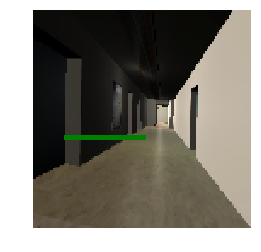

time: 19.40.11, run: 00002_esatv3, frame: 191, loss: 0.424722909927


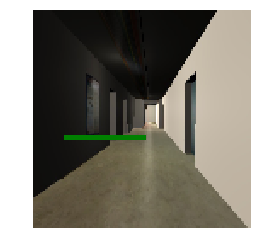

time: 19.40.11, run: 00002_esatv3, frame: 192, loss: 0.465952068567


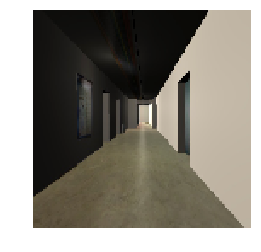

time: 19.40.11, run: 00002_esatv3, frame: 193, loss: 0.425415307283


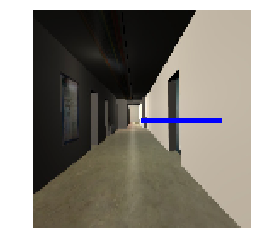

time: 19.40.12, run: 00002_esatv3, frame: 194, loss: 0.460307687521


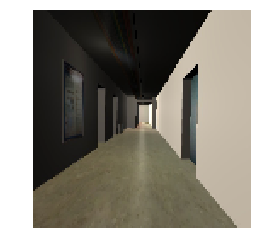

time: 19.40.12, run: 00002_esatv3, frame: 195, loss: 0.424301415682


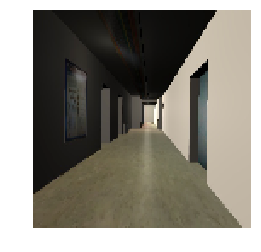

time: 19.40.12, run: 00002_esatv3, frame: 196, loss: 0.455094993114


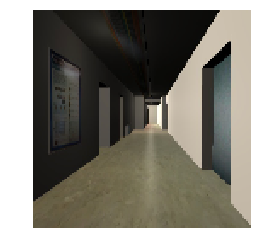

time: 19.40.13, run: 00002_esatv3, frame: 197, loss: 0.421479165554


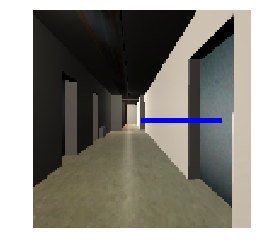

time: 19.40.13, run: 00002_esatv3, frame: 198, loss: 0.4505597651


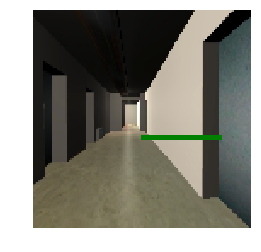

time: 19.40.14, run: 00002_esatv3, frame: 199, loss: 0.422164320946


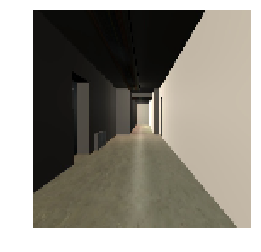

time: 19.40.14, run: 00002_esatv3, frame: 200, loss: 0.450961083174


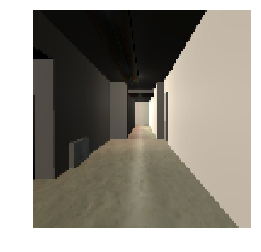

time: 19.40.14, run: 00002_esatv3, frame: 201, loss: 0.419394731522


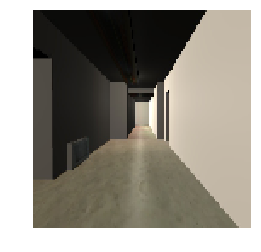

time: 19.40.15, run: 00002_esatv3, frame: 202, loss: 0.446244567633


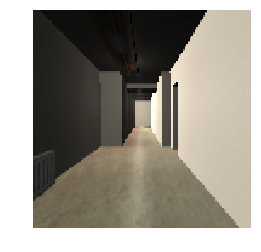

time: 19.40.15, run: 00002_esatv3, frame: 203, loss: 0.416153818369


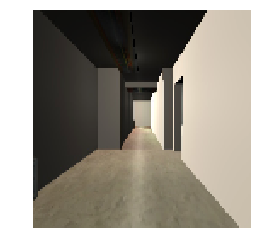

time: 19.40.16, run: 00002_esatv3, frame: 204, loss: 0.441638618708


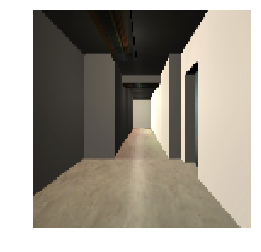

time: 19.40.16, run: 00002_esatv3, frame: 205, loss: 0.412656903267


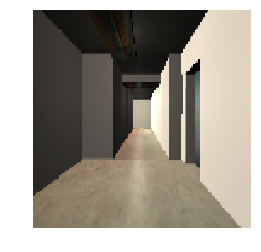

time: 19.40.16, run: 00002_esatv3, frame: 206, loss: 0.437208473682


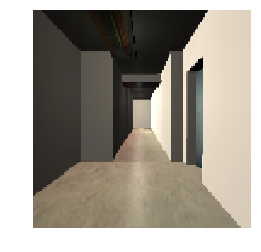

time: 19.40.17, run: 00002_esatv3, frame: 207, loss: 0.409217655659


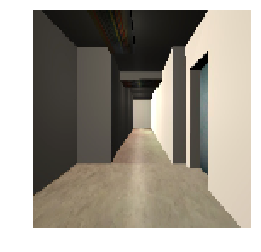

time: 19.40.17, run: 00002_esatv3, frame: 208, loss: 0.432944983244


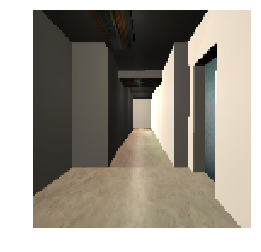

time: 19.40.17, run: 00002_esatv3, frame: 209, loss: 0.405940622091


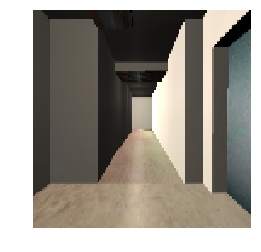

time: 19.40.18, run: 00002_esatv3, frame: 210, loss: 0.428851038218


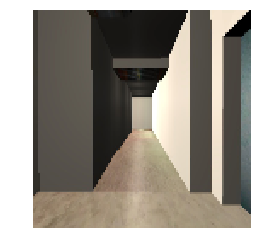

time: 19.40.18, run: 00002_esatv3, frame: 211, loss: 0.402833849192


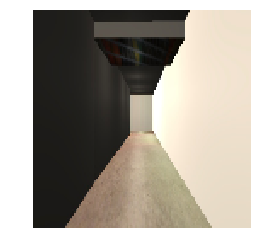

time: 19.40.18, run: 00002_esatv3, frame: 212, loss: 0.424904406071


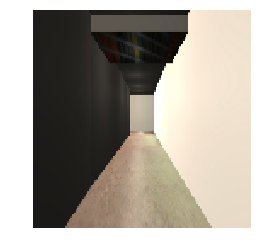

time: 19.40.19, run: 00002_esatv3, frame: 213, loss: 0.399850398302


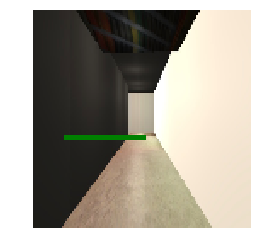

time: 19.40.19, run: 00002_esatv3, frame: 214, loss: 0.437933236361


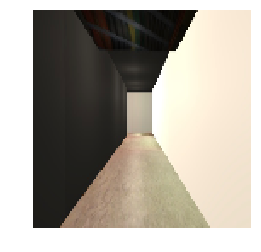

time: 19.40.19, run: 00002_esatv3, frame: 215, loss: 0.409562557936


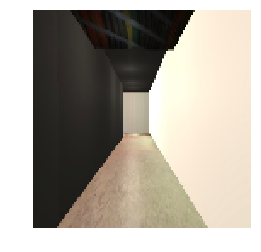

time: 19.40.20, run: 00002_esatv3, frame: 216, loss: 0.433848232031


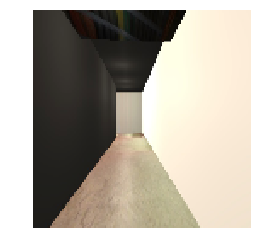

time: 19.40.20, run: 00002_esatv3, frame: 217, loss: 0.407903403044


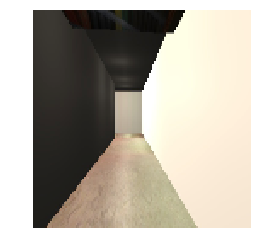

time: 19.40.20, run: 00002_esatv3, frame: 218, loss: 0.430382788181


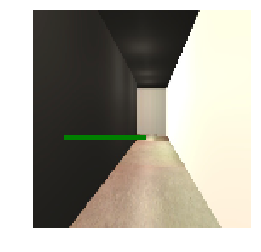

time: 19.40.21, run: 00002_esatv3, frame: 219, loss: 0.411270439625


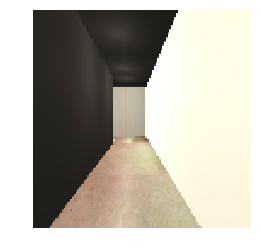

time: 19.40.21, run: 00002_esatv3, frame: 220, loss: 0.435825735331


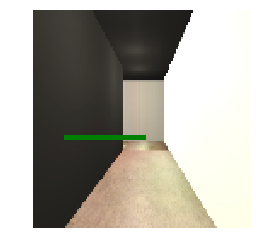

time: 19.40.21, run: 00002_esatv3, frame: 221, loss: 0.416381001472


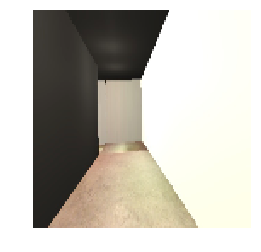

time: 19.40.22, run: 00002_esatv3, frame: 222, loss: 0.442187041044


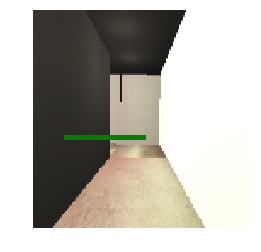

time: 19.40.22, run: 00002_esatv3, frame: 223, loss: 0.425271242857


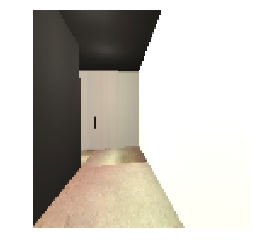

time: 19.40.23, run: 00002_esatv3, frame: 224, loss: 0.451998770237


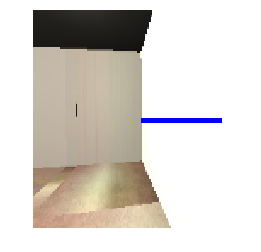

time: 19.40.23, run: 00002_esatv3, frame: 225, loss: 0.424433141947


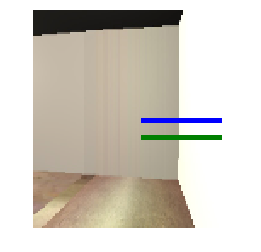

time: 19.40.23, run: 00002_esatv3, frame: 226, loss: 0.449181348085


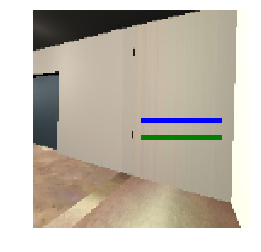

time: 19.40.24, run: 00002_esatv3, frame: 227, loss: 0.420472979546


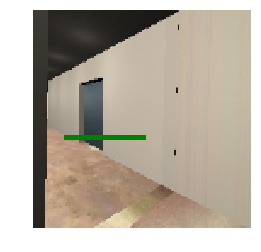

time: 19.40.24, run: 00002_esatv3, frame: 228, loss: 0.447371929884


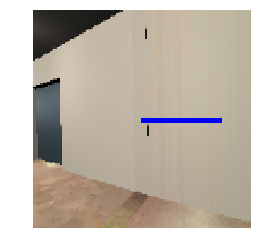

time: 19.40.24, run: 00002_esatv3, frame: 229, loss: 0.424248039722


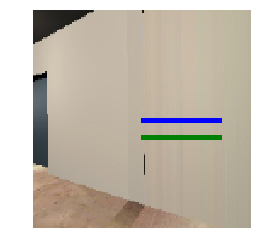

time: 19.40.25, run: 00002_esatv3, frame: 230, loss: 0.447997421026


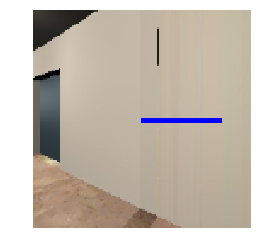

time: 19.40.25, run: 00002_esatv3, frame: 231, loss: 0.425713211298


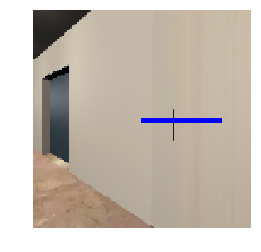

time: 19.40.25, run: 00002_esatv3, frame: 232, loss: 0.453214883804


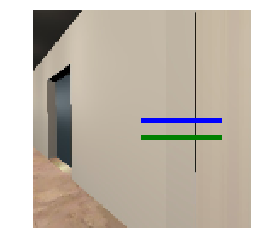

time: 19.40.26, run: 00002_esatv3, frame: 233, loss: 0.427645295858


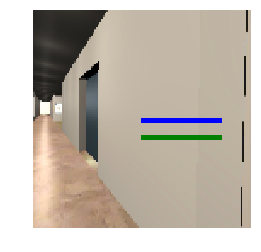

time: 19.40.26, run: 00002_esatv3, frame: 234, loss: 0.450344502926


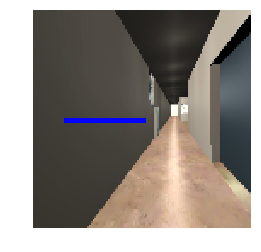

time: 19.40.27, run: 00002_esatv3, frame: 235, loss: 0.430230736732


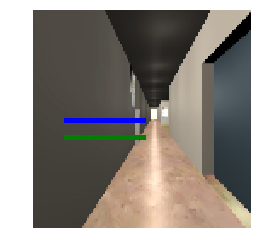

time: 19.40.27, run: 00002_esatv3, frame: 236, loss: 0.450878322124


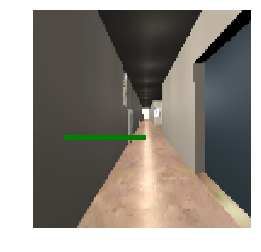

time: 19.40.27, run: 00002_esatv3, frame: 237, loss: 0.428907692432


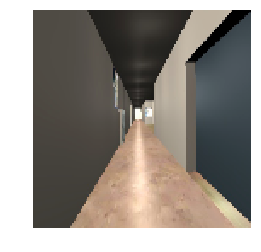

time: 19.40.28, run: 00002_esatv3, frame: 238, loss: 0.450109869242


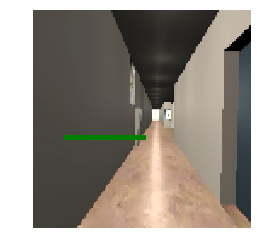

time: 19.40.28, run: 00002_esatv3, frame: 239, loss: 0.426066219807


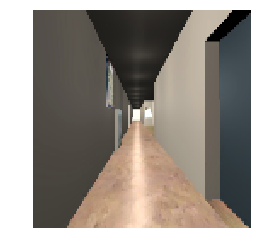

time: 19.40.29, run: 00002_esatv3, frame: 240, loss: 0.447698235512


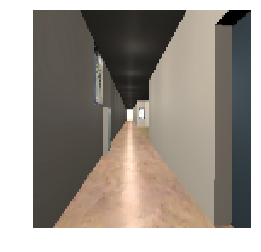

time: 19.40.29, run: 00002_esatv3, frame: 241, loss: 0.422680467367


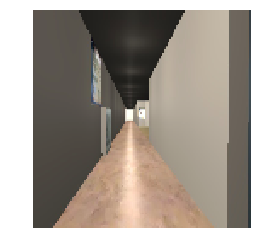

time: 19.40.29, run: 00002_esatv3, frame: 242, loss: 0.443632215261


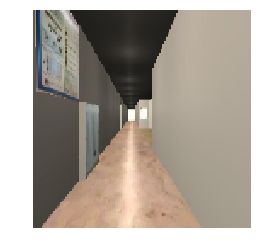

time: 19.40.30, run: 00002_esatv3, frame: 243, loss: 0.419841080904


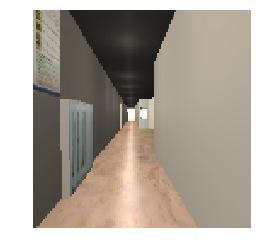

time: 19.40.30, run: 00002_esatv3, frame: 244, loss: 0.439944714308


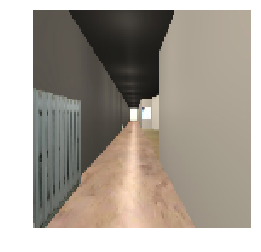

time: 19.40.31, run: 00002_esatv3, frame: 245, loss: 0.417370885611


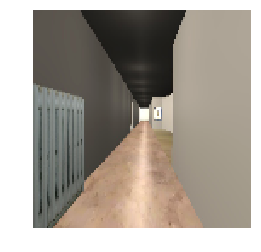

time: 19.40.31, run: 00002_esatv3, frame: 246, loss: 0.436172604561


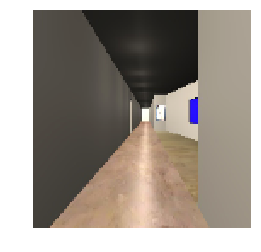

time: 19.40.32, run: 00002_esatv3, frame: 247, loss: 0.414031296968


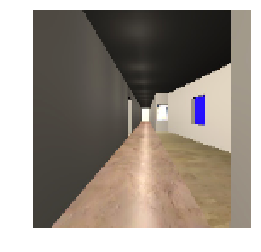

time: 19.40.32, run: 00002_esatv3, frame: 248, loss: 0.432306021452


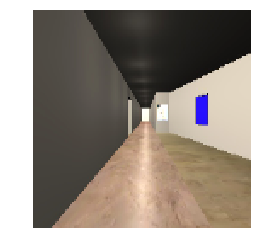

time: 19.40.32, run: 00002_esatv3, frame: 249, loss: 0.410775184631


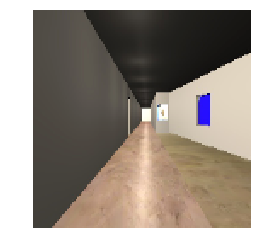

time: 19.40.33, run: 00002_esatv3, frame: 250, loss: 0.428566604853


In [46]:
# Initialize buffers
hard_buffer=[]
loss_window=[]
last_loss_window_mean=0
last_loss_window_variance=0
on_plateau=False
count_updates=0

mymodel.initialize_network()
mymodel.omegas=[]
mymodel.star_variables=[]

# Keep track of variables for plotting
stime=time.time()
loss_window_means=[]
loss_window_stds=[]
imitation_loss=[]
plateau_tags=[]
peak_tags=[]

# Save annotated camera views
if os.path.isdir(FLAGS.summary_dir+FLAGS.log_tag+'/RGB'): shutil.rmtree(FLAGS.summary_dir+FLAGS.log_tag+'/RGB')
os.makedirs(FLAGS.summary_dir+FLAGS.log_tag+'/RGB')


# Loop over data
for run in data.full_set['train']:
    for sample_index in range(len(run['num_imgs'])):
        if not FLAGS.load_data_in_ram:
            image=tools.load_rgb(im_file=os.path.join(run['name'],'RGB', '{0:010d}.jpg'.format(run['num_imgs'][sample_index])), 
                                  im_size=mymodel.input_size, 
                                  im_mode='CHW',
                                  im_norm='shifted' if FLAGS.shifted_input else 'none',
                                  im_means=FLAGS.scale_means,
                                  im_stds=FLAGS.scale_stds)
        else:
            image=run['imgs'][sample_index]
        label=run['controls'][sample_index]
        
        # save experience in buffer
        hard_buffer.append({'state':image,'trgt':label})
        
        if len(hard_buffer) < FLAGS.batch_size: continue
        
        msg='run: {0}, frame: {1}'.format(os.path.basename(run['name']),sample_index)
        x=np.array([_['state'] for _ in hard_buffer])
        y=np.array([_['trgt'] for _ in hard_buffer])
        # take training steps
        for gs in range(FLAGS.gradient_steps):
            epoch, predictions, losses, hidden_states = mymodel.train(x,y)
            # add loss value to window
            if gs==0: 
                loss_window.append(np.mean(losses['imitation_learning']))
                if len(loss_window)>FLAGS.loss_window_length: del loss_window[0]
        msg='{0}, loss: {1}'.format(msg,np.mean(losses['imitation_learning']))
        
        # calculate mean and standard deviation to detect plateau or peak        
        loss_window_mean=np.mean(loss_window)
        loss_window_std=np.std(loss_window)
        
        if on_plateau and loss_window_mean > last_loss_window_mean+last_loss_window_std:
            on_plateau=False
            peak_tags.append(len(imitation_loss)-1)
            print("peak detected")

        if FLAGS.continual_learning \
            and loss_window_mean < FLAGS.loss_window_mean_threshold \
            and loss_window_std < FLAGS.loss_window_std_threshold \
            and not on_plateau:
            last_loss_window_mean=loss_window_mean
            last_loss_window_std=loss_window_std
            on_plateau=True
            print("calculate importance weights")
            omegas_old=mymodel.omegas[:]
            mymodel.star_variables=[]
            gradients=tools.calculate_importance_weights(model=mymodel,input_images=list(x))
            for pindex, p in enumerate(mymodel.net.parameters()):
                gradients[pindex]=torch.from_numpy(gradients[pindex]).type(torch.FloatTensor).to(mymodel.device)
                if len(omegas_old) != 0:
                    mymodel.omegas.append(1/count_updates*gradients[pindex]+(1-1/count_updates)*omegas_old[pindex])
                else:
                    mymodel.omegas.append(gradients[pindex])
                mymodel.star_variables.append(p.data.clone().detach().to(mymodel.device))
            count_updates+=1
            plateau_tags.append(len(imitation_loss)-1)
        
        # update hard buffer
        hard_loss=losses['total']
        try:
            sorted_inputs=[np.asarray(lx) for _,lx in reversed(sorted(zip(hard_loss.tolist(),x),key= lambda f:f[0]))]
            sorted_targets=[ly for _,ly in reversed(sorted(zip(hard_loss.tolist(),y),key= lambda f:f[0]))]
        except:
            print("Failed to update hard_buffer.")
        hard_buffer=[{'state':sorted_inputs[i],'trgt':sorted_targets[i]} for i in range(min(FLAGS.buffer_size,len(sorted_inputs)))]
        
        # save some values for logging
        imitation_loss.append(np.mean(losses['imitation_learning']))
        loss_window_means.append(loss_window_mean)
        loss_window_stds.append(loss_window_std)
        
        # annotate frame with predicted control
        if len(imitation_loss) != 0:
            ctr,_,_=mymodel.predict(np.expand_dims(image,axis=0))
            plt.imshow(image.transpose(1,2,0).astype(np.float32)+0.5)
            plt.plot((image.shape[1]/2,image.shape[1]/2+ctr[0]*50), (image.shape[2]/2,image.shape[2]/2), linewidth=5, markersize=12,color='b')
            plt.plot((image.shape[1]/2,image.shape[1]/2+label*50), (image.shape[2]/2+10,image.shape[2]/2+10), linewidth=5, markersize=12,color='g')
            plt.axis('off')
            plt.savefig(FLAGS.summary_dir+FLAGS.log_tag+'/RGB/{0:010d}.jpg'.format(len(imitation_loss)))
#             plt.show()
        
        print("time: {0}, {1}".format(time.strftime('%H.%M.%S'), msg))

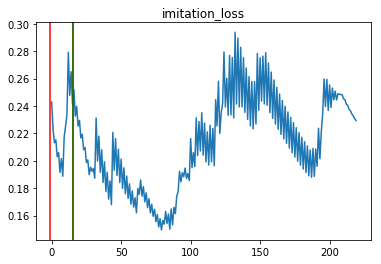

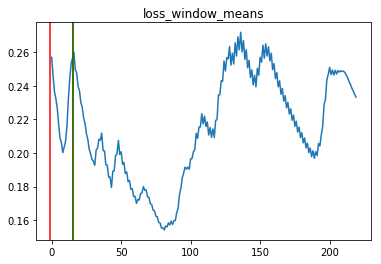

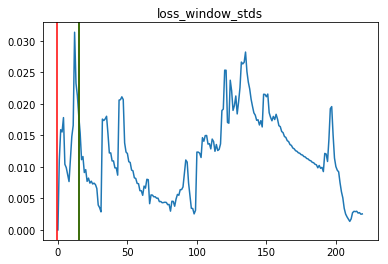

In [39]:
# Plot results
import matplotlib.pyplot as plt

for vals in ['imitation_loss', 'loss_window_means', 'loss_window_stds']:
    plt.plot(eval(vals))
    plt.title(vals)
    for v in plateau_tags:
        plt.axvline(x=v,color='r')
    for v in peak_tags:
        plt.axvline(x=v,color='g')
    plt.show()

In [30]:
mymodel.save(FLAGS.summary_dir+FLAGS.log_tag)

In [20]:
# Data preparations for forest trail dataset
original_dir='/esat/opal/kkelchte/z_datasets/ForestTrailDataset'
data=[]
runs=["{0:03d}".format(r) for r in range(4,12)]
# corresponding steering directions according to camera
labels={'sc':0, 'lc': -1, 'rc': 1}
for run in runs:
    # prepare run by loading image locations in a dict and clipping at shortest length
    run_dir= original_dir+'/'+run
    print run_dir
    images={}
    for cam in ['rc','sc','lc']:
        images[cam]=[]
        frames_dir=[run_dir+'/videos/'+cam+'/'+f for f in os.listdir(run_dir+'/videos/'+cam) if os.path.isdir(run_dir+'/videos/'+cam+'/'+f)][-1]
        for img_index in range(len(os.listdir(frames_dir))+100):
            if os.path.isfile(frames_dir+'/frame'+str(img_index)+'.jpg'):
                images[cam].append(frames_dir+'/frame'+str(img_index)+'.jpg')
    # clip lengths of camera's according to shortest sequence
    shortest_length=min([len(images[cam]) for cam in images.keys()])
    for cam in images.keys(): 
        images[cam] = images[cam][:shortest_length]
    data.append(images)

/esat/opal/kkelchte/z_datasets/ForestTrailDataset/004
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/005
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/006
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/007
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/008
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/009
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/010
/esat/opal/kkelchte/z_datasets/ForestTrailDataset/011


[model]: loaded model from /esat/opal/kkelchte/docker_home/tensorflow/log/tinyv3_net_scratch at epoch: 0
time: 12.22.19, run: 0/8, frame: 10, loss: 1.09309673309
time: 12.22.19, run: 0/8, frame: 10, loss: 1.04533958435
time: 12.22.19, run: 0/8, frame: 11, loss: 0.998178839684
time: 12.22.20, run: 0/8, frame: 11, loss: 0.937496840954
time: 12.22.20, run: 0/8, frame: 11, loss: 0.859223544598
time: 12.22.20, run: 0/8, frame: 12, loss: 0.770262479782
time: 12.22.20, run: 0/8, frame: 12, loss: 0.673255562782
time: 12.22.20, run: 0/8, frame: 12, loss: 0.5678139925
time: 12.22.20, run: 0/8, frame: 13, loss: 0.46239310503
time: 12.22.20, run: 0/8, frame: 13, loss: 0.381296426058
time: 12.22.20, run: 0/8, frame: 13, loss: 0.290380954742
time: 12.22.20, run: 0/8, frame: 14, loss: 0.218840643764
time: 12.22.20, run: 0/8, frame: 14, loss: 0.169625684619
calculate importance weights
[tools] calculate_importance_weights
0
[tools] duration 0.142453193665
time: 12.22.20, run: 0/8, frame: 14, loss: 0.1

time: 12.22.35, run: 0/8, frame: 55, loss: 0.00487484782934
time: 12.22.35, run: 0/8, frame: 55, loss: 0.00437828758731
time: 12.22.35, run: 0/8, frame: 55, loss: 0.00418427446857
time: 12.22.35, run: 0/8, frame: 56, loss: 0.00400157924742
time: 12.22.35, run: 0/8, frame: 56, loss: 0.00401459867135
time: 12.22.36, run: 0/8, frame: 56, loss: 0.00405801646411
time: 12.22.36, run: 0/8, frame: 57, loss: 0.00410351483151
time: 12.22.36, run: 0/8, frame: 57, loss: 0.0038439151831
time: 12.22.36, run: 0/8, frame: 57, loss: 0.00386306480505
time: 12.22.36, run: 0/8, frame: 58, loss: 0.00369451241568
time: 12.22.36, run: 0/8, frame: 58, loss: 0.00378267187625
time: 12.22.36, run: 0/8, frame: 58, loss: 0.00374623620883
time: 12.22.37, run: 0/8, frame: 59, loss: 0.00368972448632
time: 12.22.37, run: 0/8, frame: 59, loss: 0.00359996338375
time: 12.22.37, run: 0/8, frame: 59, loss: 0.0035930168815
time: 12.22.37, run: 0/8, frame: 60, loss: 0.00347107951529
time: 12.22.37, run: 0/8, frame: 60, loss:

time: 12.22.59, run: 0/8, frame: 100, loss: 0.00227414094843
time: 12.23.00, run: 0/8, frame: 101, loss: 0.00220822589472
time: 12.23.00, run: 0/8, frame: 101, loss: 0.00224779546261
time: 12.23.00, run: 0/8, frame: 101, loss: 0.00218618451618
time: 12.23.00, run: 0/8, frame: 102, loss: 0.00222048861906
time: 12.23.00, run: 0/8, frame: 102, loss: 0.00216468190774
time: 12.23.01, run: 0/8, frame: 102, loss: 0.00219430518337
time: 12.23.01, run: 0/8, frame: 103, loss: 0.00214303471148
time: 12.23.01, run: 0/8, frame: 103, loss: 0.00216932687908
time: 12.23.01, run: 0/8, frame: 103, loss: 0.00212149275467
time: 12.23.01, run: 0/8, frame: 104, loss: 0.00214497419074
time: 12.23.02, run: 0/8, frame: 104, loss: 0.00210011773743
time: 12.23.02, run: 0/8, frame: 104, loss: 0.00212258985266
time: 12.23.02, run: 0/8, frame: 105, loss: 0.00207717437297
time: 12.23.02, run: 0/8, frame: 105, loss: 0.00210546771996
time: 12.23.03, run: 0/8, frame: 105, loss: 0.00205470481887
time: 12.23.03, run: 0/8

KeyboardInterrupt: 

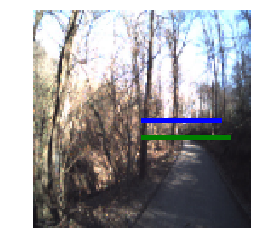

In [31]:
# Integrated method for forest trail dataset

# Initialize buffers
hard_buffer=[]
loss_window=[]
last_loss_window_mean=0
last_loss_window_variance=0
on_plateau=False
count_updates=0

mymodel.initialize_network()
mymodel.omegas=[]
mymodel.star_variables=[]

# Keep track of variables for plotting
stime=time.time()
loss_window_means=[]
loss_window_stds=[]
imitation_loss=[]
plateau_tags=[]
peak_tags=[]

# Save annotated camera views
if os.path.isdir(FLAGS.summary_dir+FLAGS.log_tag+'/RGB'): shutil.rmtree(FLAGS.summary_dir+FLAGS.log_tag+'/RGB')
os.makedirs(FLAGS.summary_dir+FLAGS.log_tag+'/RGB')

for run_index, images in enumerate(data):
#     print("time: {2}, run {0} of the {1}, {2}".format(run_index, len(data), time.strftime('%H.%M.%S')))
    for img_index in range(len(images['lc'])):
        for cam in images.keys():
            label=labels[cam]
            image=tools.load_rgb(im_file=images[cam][img_index], 
                                  im_size=mymodel.input_size, 
                                  im_mode='CHW',
                                  im_norm='shifted' if FLAGS.shifted_input else 'none',
                                  im_means=FLAGS.scale_means,
                                  im_stds=FLAGS.scale_stds)
            # save experience in buffer
            hard_buffer.append({'state':image,'trgt':label})

            if len(hard_buffer) < FLAGS.batch_size: continue

            msg='run: {0}/{2}, frame: {1}'.format(run_index,img_index, len(data))
            x=np.array([_['state'] for _ in hard_buffer])
            y=np.array([_['trgt'] for _ in hard_buffer])
            # take training steps
            for gs in range(FLAGS.gradient_steps):
                epoch, predictions, losses, hidden_states = mymodel.train(x,y)
                # add loss value to window
                if gs==0: 
                    loss_window.append(np.mean(losses['imitation_learning']))
                    if len(loss_window)>FLAGS.loss_window_length: del loss_window[0]
            msg='{0}, loss: {1}'.format(msg,np.mean(losses['imitation_learning']))

            # calculate mean and standard deviation to detect plateau or peak        
            loss_window_mean=np.mean(loss_window)
            loss_window_std=np.std(loss_window)

            if on_plateau and loss_window_mean > last_loss_window_mean+last_loss_window_std:
                on_plateau=False
                peak_tags.append(len(imitation_loss)-1)
                print("peak detected")

            if FLAGS.continual_learning \
                and loss_window_mean < FLAGS.loss_window_mean_threshold \
                and loss_window_std < FLAGS.loss_window_std_threshold \
                and not on_plateau:
                last_loss_window_mean=loss_window_mean
                last_loss_window_std=loss_window_std
                on_plateau=True
                print("calculate importance weights")
                omegas_old=mymodel.omegas[:]
                mymodel.star_variables=[]
                gradients=tools.calculate_importance_weights(model=mymodel,input_images=list(x))
                for pindex, p in enumerate(mymodel.net.parameters()):
                    gradients[pindex]=torch.from_numpy(gradients[pindex]).type(torch.FloatTensor).to(mymodel.device)
                    if len(omegas_old) != 0:
                        mymodel.omegas.append(1/count_updates*gradients[pindex]+(1-1/count_updates)*omegas_old[pindex])
                    else:
                        mymodel.omegas.append(gradients[pindex])
                    mymodel.star_variables.append(p.data.clone().detach().to(mymodel.device))
                count_updates+=1
                plateau_tags.append(len(imitation_loss)-1)

            # update hard buffer
            hard_loss=losses['total']
            try:
                sorted_inputs=[np.asarray(lx) for _,lx in reversed(sorted(zip(hard_loss.tolist(),x),key= lambda f:f[0]))]
                sorted_targets=[ly for _,ly in reversed(sorted(zip(hard_loss.tolist(),y),key= lambda f:f[0]))]
            except:
                print("Failed to update hard_buffer.")
            hard_buffer=[{'state':sorted_inputs[i],'trgt':sorted_targets[i]} for i in range(min(FLAGS.buffer_size,len(sorted_inputs)))]

            # save some values for logging
            imitation_loss.append(np.mean(losses['imitation_learning']))
            loss_window_means.append(loss_window_mean)
            loss_window_stds.append(loss_window_std)

            # annotate frame with predicted control
            if len(imitation_loss) != 0:
                plt.cla()
                ctr,_,_=mymodel.predict(np.expand_dims(image,axis=0))
                plt.imshow(image.transpose(1,2,0).astype(np.float32)+0.5)
                plt.plot((image.shape[1]/2,image.shape[1]/2-ctr[0]*50), (image.shape[2]/2,image.shape[2]/2), linewidth=5, markersize=12,color='b')
                plt.plot((image.shape[1]/2,image.shape[1]/2-label*50), (image.shape[2]/2+10,image.shape[2]/2+10), linewidth=5, markersize=12,color='g')
                plt.axis('off')
                plt.text(x=5,y=image.shape[2]-10,s='Expert',color='g')
                plt.text(x=5,y=image.shape[2]-20,s='Student',color='b')
                plt.savefig(FLAGS.summary_dir+FLAGS.log_tag+'/RGB/{0:010d}.jpg'.format(len(imitation_loss)))
#                 plt.show()
#             import pdb; pdb.set_trace()
            print("time: {0}, {1}".format(time.strftime('%H.%M.%S'), msg))

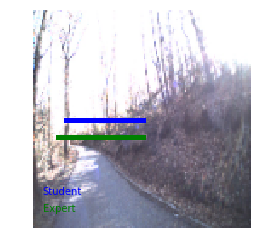

In [37]:
ctr,_,_=mymodel.predict(np.expand_dims(image,axis=0))
plt.imshow(image.transpose(1,2,0).astype(np.float32)+0.5)
plt.plot((image.shape[1]/2,image.shape[1]/2-ctr[0]*50), (image.shape[2]/2,image.shape[2]/2), linewidth=5, markersize=12,color='b')
plt.plot((image.shape[1]/2,image.shape[1]/2-label*50), (image.shape[2]/2+10,image.shape[2]/2+10), linewidth=5, markersize=12,color='g')
plt.text(x=5,y=image.shape[2]-10,s='Expert',color='g')
plt.text(x=5,y=image.shape[2]-20,s='Student',color='b')
plt.axis('off')
# plt.savefig(FLAGS.summary_dir+FLAGS.log_tag+'/RGB/{0:010d}.jpg'.format(len(imitation_loss)))
plt.show()